<a href="https://colab.research.google.com/github/LysanetsAndriy/HackDisaster/blob/main/HackDisaster_Swin_emb_large01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
! mkdir /content/drive/MyDrive/CVAT/data

mkdir: cannot create directory ‘/content/drive/MyDrive/CVAT/data’: No such file or directory


In [ ]:
! unzip /content/drive/MyDrive/CVAT/Dataset_CVAT.zip -d /content/drive/MyDrive/CVAT/data

Archive:  /content/drive/MyDrive/CVAT/Dataset_CVAT.zip
replace /content/drive/MyDrive/CVAT/data/annotations.xml? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


# Import libraries

In [4]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
from tqdm import tqdm
import xml.etree.ElementTree as ET
from PIL import Image, ImageDraw
from torch.utils.data import Dataset
import torchvision.transforms as T
from torchvision import transforms
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import random_split, DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau
import numpy as np
import torch
import torch.optim as optim
import torch.nn as nn
from torchvision import models
from torchsummary import summary
from torch.amp import autocast, GradScaler
import timm
from timm import create_model

# Config

In [66]:
class Config:
  #path
  data_dir = '/content/drive/MyDrive/CVAT/data'
  image_dir = os.path.join(data_dir, 'images', 'default')
  annotations_file = os.path.join(data_dir, 'annotations.xml')
  logdir = 'logdir'
  patched_dataset_dir = '/content/patch_dataset_v2_emb_zipped'
  gdrive_archive_path = '/content/drive/MyDrive/CVAT/patch_dataset_v2_emb_zipped.zip'

  #model
  num_epochs = 10
  train_batch = 52
  seed = 121224
  num_workers = 2
  device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
  pin_memory = True  # Speed up transfer to GPU

  #dataset
  patch_size=(224, 224)
  stride=112


In [6]:
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

set_seed(Config.seed)

# Datset Parsing

In [7]:
def parse_annotations(xml_file):
    """
    Parse the annotations XML file to extract unique labels, polygon, and box data.

    Args:
        xml_file (str): Path to the annotations XML file.

    Returns:
        tuple: A dictionary mapping each unique label to an integer,
               and a list of dictionaries containing image metadata and polygon/box data.
    """
    # Parse XML file
    tree = ET.parse(xml_file)
    root = tree.getroot()

    unique_labels = set()
    annotations = []

    # Iterate through each image and collect labels, polygons, and boxes
    for image in root.findall('image'):
        image_data = {
            'image_name': image.get('name'),
            'width': int(image.get('width')),
            'height': int(image.get('height')),
            'polygons': [],
            'boxes': []
        }

        # Collect polygons
        for polygon in image.findall('polygon'):
            label = polygon.get('label')
            if label:
                if label == 'Damaged roof':
                  label = 'Damage'
                elif label == 'Roof':
                  label = 'Building'
                unique_labels.add(label)
                points = polygon.get('points')
                polygon_data = {
                    'label': label,
                    'points': points
                }
                image_data['polygons'].append(polygon_data)

        # Collect boxes
        for box in image.findall('box'):
            label = box.get('label')
            if label:
                if label == 'Damaged roof':
                  label = 'Damage'
                elif label == 'Roof':
                  label = 'Building'
                unique_labels.add(label)
                xtl, ytl, xbr, ybr = map(float, [box.get('xtl'), box.get('ytl'), box.get('xbr'), box.get('ybr')])
                box_data = {
                    'label': label,
                    'xtl': xtl,
                    'ytl': ytl,
                    'xbr': xbr,
                    'ybr': ybr
                }
                image_data['boxes'].append(box_data)

        if image_data['polygons'] or image_data['boxes']:
            annotations.append(image_data)

    label_mapping = {label: idx + 1 for idx, label in enumerate(sorted(unique_labels))}
    return label_mapping, annotations


In [8]:
label_mapping, annotations = parse_annotations(Config.annotations_file)

In [9]:
print("Label Mapping:")
print(label_mapping)
print("\nSample Annotations:")
print(annotations[:2])

Label Mapping:
{'Broken Window': 1, 'Building': 2, 'Damage': 3, 'Other': 4}

Sample Annotations:
[{'image_name': 'image1.png', 'width': 1848, 'height': 966, 'polygons': [{'label': 'Other', 'points': '769.14,261.71;774.29,258.29;774.29,239.43;801.71,230.86;794.86,205.14;890.86,188.00;890.86,150.29;1065.71,150.29;1058.86,230.86;1112.00,234.29;1831.96,-0.00;1479.66,0.00;770.86,1.14'}, {'label': 'Building', 'points': '798.80,208.74;802.23,239.60;776.51,244.74;778.23,265.31;767.94,263.60;783.37,875.60;1141.66,882.46;1146.80,810.46;1102.23,719.60;1114.23,241.31;1055.94,241.31;1059.37,152.17;894.80,157.31;896.51,193.31'}, {'label': 'Other', 'points': '1112.51,342.46;1103.94,719.60;1153.66,813.89;1143.37,889.31;778.23,879.03;769.70,966.00;771.80,966.00;1848.00,964.70;1844.51,736.74;1844.51,1.31;1112.51,237.89;1054.23,237.89;1115.94,239.60;1115.94,244.74'}, {'label': 'Damage', 'points': '1112.51,340.74;1045.66,342.46;1049.09,433.31;893.09,436.74;894.80,484.74;793.66,484.74;791.94,558.46;774.80,

In [10]:
def transform_boxes_to_polygons(annotations):
    """
    Transform bounding box annotations into a polygon-like format and add them to the dataset.

    Args:
        annotations (list): List of image annotations, each containing 'polygons' and 'boxes'.

    Returns:
        list: Updated annotations with boxes transformed into polygons.
    """
    updated_annotations = []

    for image_data in annotations:
        # Create a deep copy of image data to avoid modifying the original
        new_image_data = {
            'image_name': image_data['image_name'],
            'width': image_data['width'],
            'height': image_data['height'],
            'polygons': image_data['polygons'][:]
        }

        # Convert each box to polygon format and add to 'polygons' list
        for box in image_data.get('boxes', []):
            label = box['label']
            xtl, ytl, xbr, ybr = box['xtl'], box['ytl'], box['xbr'], box['ybr']

            # Define the four corners of the box
            box_points = f"{xtl},{ytl};{xbr},{ytl};{xbr},{ybr};{xtl},{ybr}"

            # Create a new polygon data dictionary
            box_as_polygon = {
                'label': label,
                'points': box_points
            }

            # Append the converted box (now as a polygon) to the polygons list
            new_image_data['polygons'].append(box_as_polygon)

        # Append the updated image data to the list
        updated_annotations.append(new_image_data)

    return updated_annotations


In [11]:
# Apply the transformation to the annotations
annotations_with_polygons = transform_boxes_to_polygons(annotations)

print("Sample of transformed annotations with boxes as polygons:")
print(annotations_with_polygons[:2])
annotations = annotations_with_polygons

Sample of transformed annotations with boxes as polygons:
[{'image_name': 'image1.png', 'width': 1848, 'height': 966, 'polygons': [{'label': 'Other', 'points': '769.14,261.71;774.29,258.29;774.29,239.43;801.71,230.86;794.86,205.14;890.86,188.00;890.86,150.29;1065.71,150.29;1058.86,230.86;1112.00,234.29;1831.96,-0.00;1479.66,0.00;770.86,1.14'}, {'label': 'Building', 'points': '798.80,208.74;802.23,239.60;776.51,244.74;778.23,265.31;767.94,263.60;783.37,875.60;1141.66,882.46;1146.80,810.46;1102.23,719.60;1114.23,241.31;1055.94,241.31;1059.37,152.17;894.80,157.31;896.51,193.31'}, {'label': 'Other', 'points': '1112.51,342.46;1103.94,719.60;1153.66,813.89;1143.37,889.31;778.23,879.03;769.70,966.00;771.80,966.00;1848.00,964.70;1844.51,736.74;1844.51,1.31;1112.51,237.89;1054.23,237.89;1115.94,239.60;1115.94,244.74'}, {'label': 'Damage', 'points': '1112.51,340.74;1045.66,342.46;1049.09,433.31;893.09,436.74;894.80,484.74;793.66,484.74;791.94,558.46;774.80,558.46;783.37,875.60;1143.37,882.46;114

# Data visualization

In [12]:
color_mapping = {
    1: (0, 0, 255, 128),      # Blue for 'Broken Window', semi-transparent
    2: (0, 255, 0, 64),      # Green for 'Building', semi-transparent
    3: (255, 0, 255, 64),    # Purpule for 'Damage', semi-transparent
    4: (211, 211, 211, 150),  # Light grey for 'Other', semi-transparent
}

In [13]:
def load_image(image_path):
    """
    Load an image from the specified path and return it as a PIL image.

    Args:
        image_path (str): Path to the image file.

    Returns:
        PIL.Image: Loaded image.
    """
    return Image.open(image_path).convert("RGB")

In [14]:
def create_mask(image_data, label_mapping, width, height):
    """
    Create a binary mask for a single image based on the polygon annotations.

    Args:
        image_data (dict): Annotation data for a single image, containing polygon coordinates.
        label_mapping (dict): Mapping of labels to integer values for mask encoding.
        width (int): Width of the mask (same as image width).
        height (int): Height of the mask (same as image height).

    Returns:
        numpy.array: Mask with polygons drawn for segmentation.
    """
    # Other, Building, Roof, Damage, Damaged Roof, Broken Window
    priority_order = {
        "Broken Window": 4,
        "Damage": 3,
        "Building": 2,
        "Other": 1
    }

    # Sort polygons by priority (lower priority values are drawn first)
    sorted_polygons = sorted(image_data['polygons'], key=lambda p: priority_order.get(p['label']))

    mask = Image.new("RGBA", (width, height), (0, 0, 0, 0))  # Create an empty mask

    labels = []

    for polygon in sorted_polygons:
        label = polygon['label']
        points = polygon['points']
        points = [tuple(map(float, p.split(','))) for p in points.split(';')]

        labels.append(label)

        color = color_mapping[label_mapping[label]]

        # Draw polygon on the mask
        draw = ImageDraw.Draw(mask, "RGBA")
        draw.polygon(points, fill=color)
    print(labels)
    return np.array(mask)

In [15]:
def visualize_samples(annotations, label_mapping, num_samples=1):
    """
    Visualize a few samples from the dataset with their annotations overlayed.

    Args:
        annotations (list): List of image annotations.
        label_mapping (dict): Dictionary mapping labels to integers.
        num_samples (int): Number of samples to visualize.
    """
    plt.figure(figsize=(15, num_samples * 5))

    for i, image_data in enumerate(random.sample(annotations, num_samples)):
        image_path = os.path.join(Config.image_dir, image_data['image_name'])
        image = load_image(image_path)
        mask = create_mask(image_data, label_mapping, image.width, image.height)

        plt.subplot(num_samples, 1, i * 2 + 1)
        plt.imshow(image)
        # plt.title(f"Original Image: {image_data['image_name']}")
        plt.imshow(mask, alpha=0.7)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


In [16]:
print(annotations[6])

{'image_name': 'image7.png', 'width': 1848, 'height': 966, 'polygons': [{'label': 'Damage', 'points': '659.38,796.39;664.52,828.94;721.04,832.36;719.32,804.96'}, {'label': 'Building', 'points': '482.97,167.83;510.37,126.73;563.47,118.17;575.46,118.17;585.73,101.04;613.14,102.75;640.54,95.90;664.52,87.34;724.46,82.20;734.74,59.94;748.44,73.64;834.07,42.81;900.87,49.66;918.00,58.22;953.96,58.22;957.39,46.23;964.24,61.65;1000.21,65.07;1007.06,46.23;1031.03,47.95;1031.03,59.94;1061.86,61.65;1031.03,61.65;1010.48,44.52;1000.21,63.36;960.81,59.94;916.28,61.65;894.02,46.23;832.36,46.23;743.30,77.06;724.46,82.20;662.80,87.34;638.83,90.76;608.00,104.47;584.02,104.47;573.74,119.88;506.95,128.44'}, {'label': 'Damage', 'points': '676.51,363.08;676.51,411.04;731.31,411.04;729.60,366.51'}, {'label': 'Broken Window', 'points': '491.53,510.37;494.96,525.79;529.21,534.35;542.92,534.35;541.20,518.94'}, {'label': 'Broken Window', 'points': '491.53,381.92;486.40,400.76;566.89,399.05;597.72,392.20;628.55,3

['Other', 'Other', 'Other', 'Other', 'Building', 'Damage']


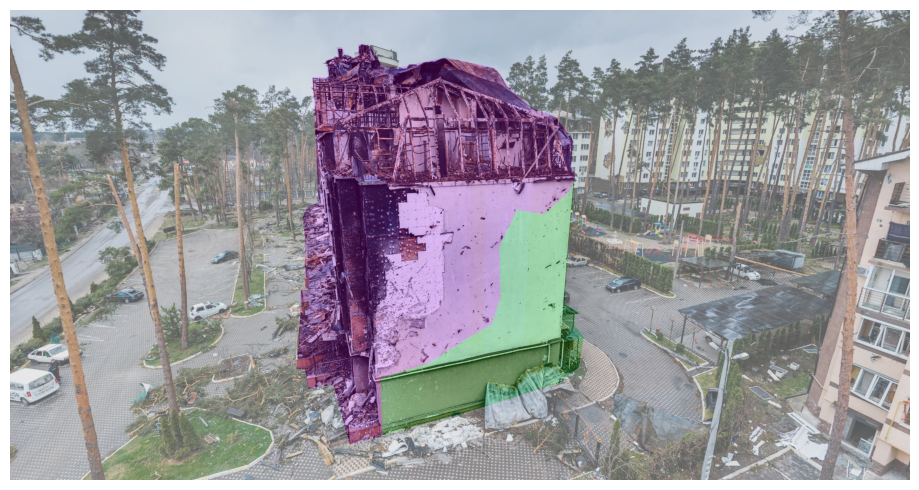

In [17]:
visualize_samples(annotations, label_mapping)

Broken Window: **Blue**, Building: **Green**, Damage: **Purple**, Other: **Grey**



---



# Create label mask

In [18]:
def create_label_mask(image_data, label_mapping, width, height):
    """
    Create an integer label mask for a single image, where each pixel's value
    corresponds to the class ID.

    Args:
        image_data (dict): Annotation data for a single image, containing polygon coordinates.
        label_mapping (dict): Mapping of labels to integer values.
        width (int): Width of the mask (same as image width).
        height (int): Height of the mask (same as image height).

    Returns:
        numpy.array: Integer mask where each pixel contains the class ID (1 to 6).
    """
    # Other, Building, Roof, Damage, Damaged Roof, Broken Window
    priority_order = {
        "Broken Window": 4,
        "Damage": 3,
        "Building": 2,
        "Other": 1
    }

    # Sort polygons by priority (lower priority values are drawn first)
    sorted_polygons = sorted(image_data['polygons'], key=lambda p: priority_order.get(p['label']))

    # Initialize mask with zeros (background)
    mask = np.zeros((height, width), dtype=np.int32)

    for polygon in sorted_polygons:
        label = polygon['label']
        points = polygon['points']
        points = [tuple(map(float, p.split(','))) for p in points.split(';')]

        # Get the class ID for the label
        class_id = label_mapping[label]

        # Draw polygon with the corresponding class ID
        pil_mask = Image.fromarray(mask)
        draw = ImageDraw.Draw(pil_mask)
        draw.polygon(points, fill=class_id)
        mask = np.array(pil_mask)  # Update mask

    return mask


In [19]:
def visualize_label_masks(samples, label_mapping, image_dir, mask_height, mask_width):
    """
    Visualize label masks for a set of sample data examples.

    Args:
        samples (list): A list of sample annotations to visualize (e.g., `annotations[:5]`).
        label_mapping (dict): Dictionary mapping labels to integer IDs.
        image_dir (str): Directory containing the images.
        mask_height (int): Height of the mask (should match the image height).
        mask_width (int): Width of the mask (should match the image width).
    """
    plt.figure(figsize=(15, len(samples)*5))

    for idx, sample in enumerate(samples):
        # Load image
        image_path = os.path.join(image_dir, sample['image_name'])
        image = Image.open(image_path).convert("RGB")

        # Generate label mask for the sample
        mask = create_label_mask(sample, label_mapping, mask_width, mask_height)
        # Plot image and mask
        plt.subplot(len(samples), 2, idx * 2 + 1)
        plt.imshow(image)
        plt.title(f"Original Image: {sample['image_name']}")
        plt.axis('off')

        plt.subplot(len(samples), 2, idx * 2 + 2)
        plt.imshow(mask, cmap='nipy_spectral')
        plt.title("Label Mask")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


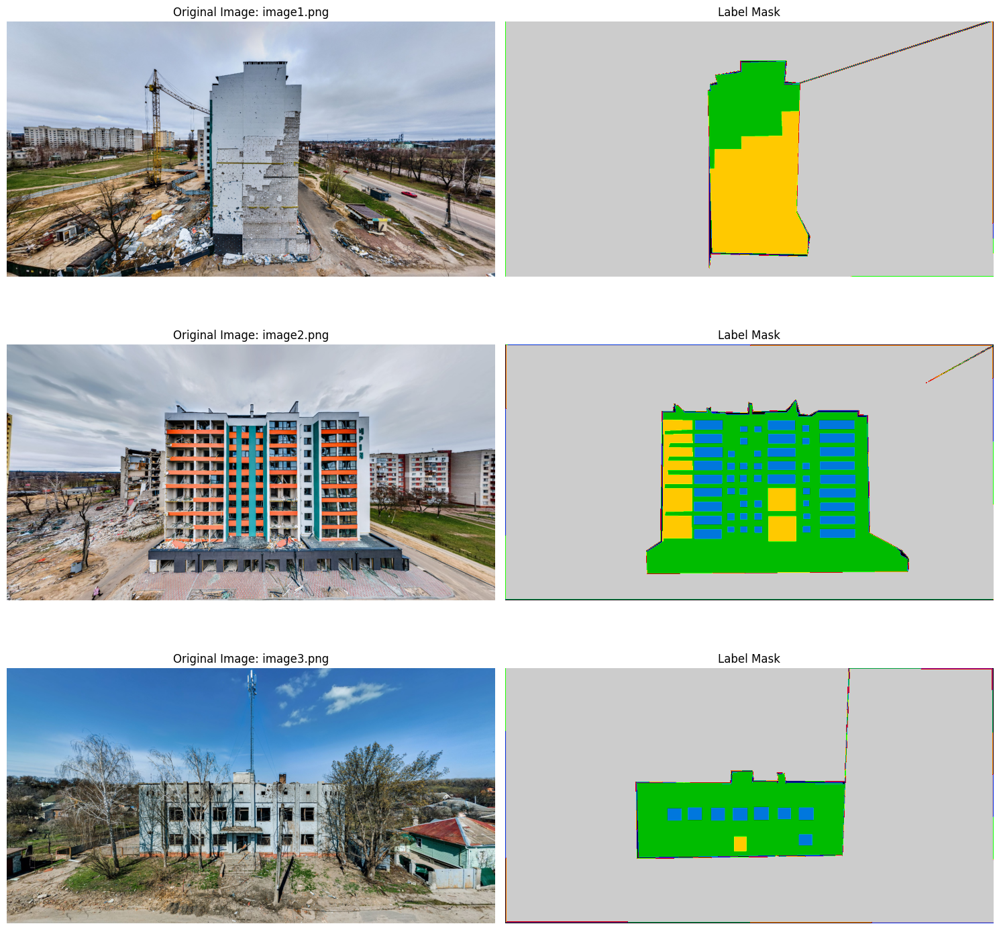

In [20]:
# Select some samples for visualization
sample_annotations = annotations[0:3]  # Change this to display more or fewer examples

# Assume all images have the same width and height; otherwise, you’ll need to handle each size.
sample_width = sample_annotations[0]['width']
sample_height = sample_annotations[0]['height']

# Visualize label masks
visualize_label_masks(sample_annotations, label_mapping, Config.image_dir, sample_height, sample_width)


{'Broken Window': 1, 'Building': 2, 'Damage': 3,  'Other': 4}

# Create Patch dataset

In [21]:
def save_patched_dataset_with_embedding(annotations, image_dir, label_mapping,
                                        output_dir, model, transform, patch_size=(224,224),
                                        stride=112, device=Config.device):
    """
    Save image and mask patches as separate files in a specified folder.

    Args:
        annotations (list): Parsed annotations containing polygon data.
        image_dir (str): Directory containing the original images.
        label_mapping (dict): Mapping of label names to integers.
        output_dir (str): Directory where patches will be stored.
        model (nn.Module): Pre-trained model to generate image embeddings (e.g., Swin Transformer).
        transform (callable): Transformation function for images before embedding generation.
        patch_size (tuple): Size of each patch (width, height).
        stride (int): Step size for sliding window.
        device (str): Device to perform computation on (e.g., 'cuda' or 'cpu').

    Returns:
        None
    """
    os.makedirs(output_dir, exist_ok=True)

    patch_index = 0  # Index to uniquely name patches

    model.eval()
    with torch.no_grad():
      for sample in tqdm(annotations, desc="Processing Images"):
          # Load the image and mask
          image_path = os.path.join(image_dir, sample['image_name'])
          image = Image.open(image_path).convert("RGB")
          width, height = image.size
          mask = create_label_mask(sample, label_mapping, width, height)

          # Convert to numpy arrays
          image_np = np.array(image)
          mask_np = np.array(mask)

          # Generate full image embedding
          image_tensor = transform(image).unsqueeze(0).to(device)
          embedding = model(image_tensor)
          embedding = embedding.squeeze(0).cpu().numpy()

          # Pad the image and mask to handle edges
          pad_w = (patch_size[0] - width % stride) % stride
          pad_h = (patch_size[1] - height % stride) % stride
          image_np = np.pad(image_np, ((0, pad_h), (0, pad_w), (0, 0)), mode='constant')
          mask_np = np.pad(mask_np, ((0, pad_h), (0, pad_w)), mode='constant')

          padded_height, padded_width = image_np.shape[:2]

          # Slide over the image with a window
          for y in range(0, padded_height - patch_size[1] + 1, stride):
              for x in range(0, padded_width - patch_size[0] + 1, stride):
                  # Extract patches
                  image_patch = image_np[y:y + patch_size[1], x:x + patch_size[0], :]
                  mask_patch = mask_np[y:y + patch_size[1], x:x + patch_size[0]]

                  # Positional embedding(normalized position)
                  pos_x = x / padded_width
                  pos_y = y / padded_height
                  positional_embedding = np.array([pos_x, pos_y], dtype=np.float32)

                  # Save image and mask patches in a single zipped npz file
                  patch_path = os.path.join(output_dir, f"patch_{patch_index}.npz")
                  np.savez_compressed(
                      patch_path,
                      image=image_patch,
                      mask=mask_patch,
                      embedding=embedding,
                      position=positional_embedding
                    )

                  patch_index += 1

    print(f"Patched dataset with embeddings saved as npz files to: {output_dir}")


In [22]:
output_dir = "/content/drive/MyDrive/CVAT/patch_dataset_v2_emb_zipped"

# swin_model = create_model(
#     'swin_base_patch4_window7_224',
#     pretrained=True,
#     num_classes=0
# )
# swin_model.to(Config.device)

# image_transform = transforms.Compose([
#     transforms.Resize((224, 224)),  # Resize to Swin Transformer input size
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
# ])

# save_patched_dataset_with_embedding(
#     annotations=annotations,
#     image_dir=Config.image_dir,
#     label_mapping=label_mapping,
#     output_dir=output_dir,
#     model=swin_model,
#     transform=image_transform,
#     patch_size=Config.patch_size,
#     stride=Config.stride,
#     device=Config.device
# )


In [23]:
import shutil

folder_to_zip = '/content/drive/MyDrive/CVAT/patch_dataset_v2_emb_zipped'
output_zip = '/content/drive/MyDrive/CVAT/patch_dataset_v2_emb_zipped.zip'

# # Create the zip file
# shutil.make_archive(
#     base_name=output_zip.replace('.zip', ''),  # Remove '.zip' extension for shutil
#     format='zip',  # Compression format
#     root_dir=folder_to_zip  # Folder to zip
# )

# print(f"Dataset zipped successfully at: {output_zip}")


In [24]:
if os.path.exists(output_zip):
    print(f"Archive created: {output_zip}")
else:
    print("Error: Archive creation failed!")


Archive created: /content/drive/MyDrive/CVAT/patch_dataset_v2_emb_zipped.zip


In [25]:
# Destination path in the Colab environment
colab_archive_path = '/content/patch_dataset_v2_emb_zipped.zip'

# Copy the file to Colab
shutil.copy(Config.gdrive_archive_path, colab_archive_path)

print(f"Archive copied to Colab: {colab_archive_path}")

Archive copied to Colab: /content/patch_dataset_v2_emb_zipped.zip


In [26]:
unzip_folder = '/content/patch_dataset_v2_emb_zipped'

# Unzip the archive
shutil.unpack_archive(colab_archive_path, unzip_folder, 'zip')

print(f"Archive unzipped to: {unzip_folder}")

Archive unzipped to: /content/patch_dataset_v2_emb_zipped


# DataSet

In [21]:
class PatchedDataset(Dataset):
    """
        Dataset class for patches with full-image embeddings and positional embeddings.

        Args:
            patch_dir (str): Directory containing patch files in `.npz` format.
            transform (callable, optional): Transformation function for images. Default is None.
    """
    def __init__(self, patch_dir, transform=None):
        self.patch_files = sorted(os.listdir(patch_dir))
        self.patch_dir = patch_dir
        self.transform = transform
        self.mask_resize = transforms.Resize(
            (224, 224),
            interpolation=transforms.InterpolationMode.NEAREST
        )

    def __len__(self):
        return len(self.patch_files)

    def __getitem__(self, idx):
        patch_path = os.path.join(self.patch_dir, self.patch_files[idx])

        patch = np.load(patch_path)

        image = Image.fromarray(patch['image'])
        mask = Image.fromarray(patch['mask'].astype(np.uint8))

        embedding = torch.tensor(patch['embedding'], dtype=torch.float32)
        position = torch.tensor(patch['position'], dtype=torch.float32)

        if self.transform is not None:
            image = self.transform(image)
        else:
            if image.size != (224,224):
              image = transforms.Resize((224,224))(image)
            image = transforms.ToTensor()(image)
            image = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                         std=[0.229, 0.224, 0.225])(image)
        if mask.size != (224,224):
          mask = self.mask_resize(mask)
        mask = np.array(mask, dtype=np.int64)
        mask = torch.from_numpy(mask).long()
        return image, mask, embedding, position

In [22]:
patched_dataset = PatchedDataset(
    patch_dir=Config.patched_dataset_dir
)

In [23]:
def display_patched_dataset_item(patched_dataset, idx):
    """
    Display an image and its corresponding mask from the patched dataset.

    Args:
        patched_dataset (Dataset): Instance of the patched dataset.
        idx (int): Index of the item to display.

    Returns:
        None
    """
    # Get the image and mask
    image, mask, embedding, position = patched_dataset[idx]  # image: tensor, mask: tensor
    print(image.shape, mask.shape)
    print(embedding.shape)
    print("====================")
    print(position)

    # Convert image tensor to NumPy array for visualization
    std = np.array([0.229, 0.224, 0.225])
    std = std.reshape((1,1,3))
    mean = np.array([0.485, 0.456, 0.406])
    mean = mean.reshape((1,1,3))


    image_np = image.permute(1, 2, 0).numpy()  # Convert [C, H, W] -> [H, W, C]
    image_np = image_np * std + mean
    image_np = np.clip(image_np, 0, 1)  # Ensure pixel values are in range [0, 1]

    # Convert mask tensor to NumPy array
    mask_np = mask.numpy()

    # Plot the image and mask side by side
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(image_np)
    axes[0].set_title("Image")
    axes[0].axis("off")

    axes[1].imshow(mask_np, cmap="nipy_spectral")
    axes[1].set_title("Mask")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

torch.Size([3, 224, 224]) torch.Size([224, 224])
torch.Size([1024])
tensor([0.6471, 0.2222])


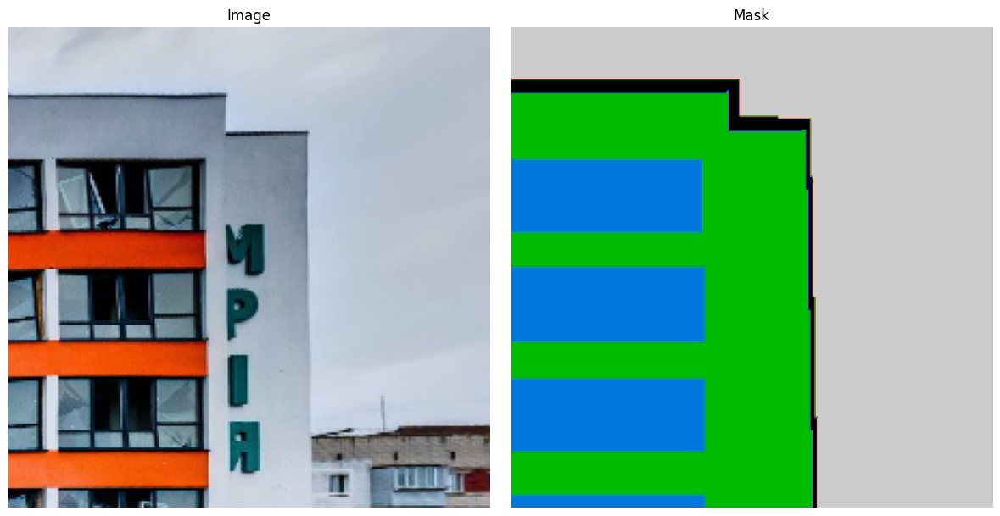

In [24]:
id = np.random.randint(len(patched_dataset))
display_patched_dataset_item(patched_dataset, idx=id)

# DataLoader

In [25]:
# Define split ratios
train_ratio = 0.8
val_ratio= 0.1
test_ratio = 0.1

# Ensure ratios add up to 1.0
assert abs(train_ratio + test_ratio + val_ratio - 1.0) < 1e-6, "Split ratios must sum to 1.0"

# Calculate lengths for train, validation, and test sets
total_length = len(patched_dataset)
train_size = int(train_ratio * total_length)
test_size = int(test_ratio * total_length)
val_size = total_length - train_size - test_size  # Remaining samples for validation

# Perform the split
train_dataset, test_dataset, val_dataset = random_split(
    patched_dataset,
    [train_size, test_size, val_size]
)

# Create DataLoaders for training, validation, and testing sets
train_dataloader = DataLoader(
    train_dataset,
    batch_size=Config.train_batch,  # Batch size for training
    shuffle=True,                   # Shuffle training data
    num_workers=Config.num_workers,
    pin_memory=Config.pin_memory                 # Speed up transfer to GPU if available
)

val_dataloader = DataLoader(
    val_dataset,
    batch_size=Config.train_batch,  # Batch size for validation
    shuffle=False,                  # No need to shuffle validation data
    num_workers=Config.num_workers,
    pin_memory=Config.pin_memory
)

test_dataloader = DataLoader(
    test_dataset,
    batch_size=Config.train_batch,  # Batch size for testing
    shuffle=False,                  # No need to shuffle testing data
    num_workers=Config.num_workers,
    pin_memory=Config.pin_memory
)

# Example output to verify the splits
print(f"Total dataset size: {total_length}")
print(f"Train set size: {len(train_dataset)}")
print(f"Validation set size: {len(val_dataset)}")
print(f"Test set size: {len(test_dataset)}")


Total dataset size: 33138
Train set size: 26510
Validation set size: 3315
Test set size: 3313


In [26]:
print(len(patched_dataset))
print(train_size)

33138
26510


# Swin-UNet model
UNet model with Swin-Transformer as backbone

In [27]:
class UNetSwin(nn.Module):
    def __init__(self, num_classes, pretrained=True):
        """
        Initialize the U-Net model with a pre-trained Swin Transformer encoder.

        Args:
            num_classes (int): Number of output classes for segmentation.
            pretrained (bool): If True, use pre-trained Swin weights.
        """
        super(UNetSwin, self).__init__()
        self.num_classes = num_classes

        # Load pre-trained Swin Transformer
        self.encoder = create_model(
            'swin_large_patch4_window7_224',
            pretrained=pretrained,
            features_only=True,
            out_indices=(0, 1, 2, 3)
            )
        encoder_channels = self.encoder.feature_info.channels()
        print(encoder_channels)
        self.image_embedding_fc = nn.Linear(1024, encoder_channels[3])
        self.positional_embedding_fc = nn.Linear(2, encoder_channels[3])

        # Decoder Layers
        bottleneck_channels = encoder_channels[3] + encoder_channels[3] + encoder_channels[3]
        self.upconv4 = nn.ConvTranspose2d(bottleneck_channels, encoder_channels[2], kernel_size=2, stride=2)
        self.decoder4 = self.conv_block(encoder_channels[2] + encoder_channels[2], encoder_channels[2])

        self.upconv3 = nn.ConvTranspose2d(encoder_channels[2], encoder_channels[1], kernel_size=2, stride=2)
        self.decoder3 = self.conv_block(encoder_channels[1] + encoder_channels[1], encoder_channels[1])

        self.upconv2 = nn.ConvTranspose2d(encoder_channels[1], encoder_channels[0], kernel_size=2, stride=2)
        self.decoder2 = self.conv_block(encoder_channels[0] + encoder_channels[0], encoder_channels[0])

        self.upconv1 = nn.ConvTranspose2d(encoder_channels[0], encoder_channels[0], kernel_size=2, stride=2)
        self.decoder1 = self.conv_block(encoder_channels[0], encoder_channels[0])

        # Final Classifier
        self.conv_last = nn.Conv2d(encoder_channels[0], self.num_classes, kernel_size=1)

        self.freeze_encoder_layers(freeze_layers=[0, 1])


    def conv_block(self, in_channels, out_channels):
        """
        Convolutional block consisting of Conv -> BatchNorm -> ReLU.

        Args:
            in_channels (int): Number of input channels.
            out_channels (int): Number of output channels.

        Returns:
            nn.Sequential: Convolutional block.
        """
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def freeze_encoder_layers(self, freeze_layers=None):
      """
      Freeze specified layers of the encoder.

      Args:
          freeze_layers (list or None): List of layer indices to freeze. If None, freeze all layers.
                                        Example: [0, 1, 3] to freeze stages 0, 1, and 3.
      """
      if freeze_layers is None:
          # Freeze all layers if no specific layers are mentioned
          for param in self.encoder.parameters():
              param.requires_grad = False
          print("All encoder layers frozen.")
      else:
          for idx, layer in enumerate(self.encoder.children()):
              if idx in freeze_layers:
                  for param in layer.parameters():
                      param.requires_grad = False
                  print(f"Encoder layer {idx} frozen.")
              else:
                  for param in layer.parameters():
                      param.requires_grad = True
                  print(f"Encoder layer {idx} unfrozen.")


    def unfreeze_encoder_layers(self, unfreeze_layers=None):
      """
      Unfreeze specified layers of the encoder.

      Args:
          unfreeze_layers (list or None): List of layer indices to unfreeze. If None, unfreeze all layers.
                                          Example: [0, 2] to unfreeze stages 0 and 2.
      """
      if unfreeze_layers is None:
          # Unfreeze all layers if no specific layers are mentioned
          for param in self.encoder.parameters():
              param.requires_grad = True
          print("All encoder layers unfrozen.")
      else:
          for idx, layer in enumerate(self.encoder.children()):
              if idx in unfreeze_layers:
                  for param in layer.parameters():
                      param.requires_grad = True
                  print(f"Encoder layer {idx} unfrozen.")
              else:
                  for param in layer.parameters():
                      param.requires_grad = False
                  print(f"Encoder layer {idx} frozen.")


    def forward(self, x, image_embedding, position_embedding):
      """
      Forward pass of the SwinUNet model.

      Args:
          x (torch.Tensor): Input tensor of shape [batch_size, 3, H, W]

      Returns:
          torch.Tensor: Output tensor of shape [batch_size, num_classes, H, W]
      """
      # Encoder: Swin Transformer
      # об'єднати x, image_embedding, position_embedding у просто х
      features = self.encoder(x)  # List of feature maps from different stages

      enc1, enc2, enc3, enc4 = [f.permute(0, 3, 1, 2) for f in features]

      img_emb_proj = self.image_embedding_fc(image_embedding)
      pos_emb_proj = self.positional_embedding_fc(position_embedding)

      img_emb_proj = img_emb_proj[:, :, None, None].expand(-1, -1, enc4.shape[2], enc4.shape[3])
      pos_emb_proj = pos_emb_proj[:, :, None, None].expand(-1, -1, enc4.shape[2], enc4.shape[3])

      bottleneck = torch.cat([enc4, img_emb_proj, pos_emb_proj], dim=1)

      # Decoder Path
      dec4 = self.upconv4(bottleneck)
      dec4 = torch.cat((dec4, enc3), dim=1)
      dec4 = self.decoder4(dec4)

      dec3 = self.upconv3(dec4)
      dec3 = torch.cat((dec3, enc2), dim=1)
      dec3 = self.decoder3(dec3)

      dec2 = self.upconv2(dec3)
      dec2 = torch.cat((dec2, enc1), dim=1)
      dec2 = self.decoder2(dec2)

      dec1 = self.upconv1(dec2)
      dec1 = self.decoder1(dec1)

      # Final Upsampling to Original Size
      out = F.interpolate(dec1, scale_factor=2, mode='bilinear', align_corners=True)
      out = self.conv_last(out)

      return out



In [28]:
def custom_summary(model, x_shape, emb_shape, pos_shape, device=Config.device):
    """
    Print a summary of the model by performing a forward pass with dummy inputs.

    Args:
        model (nn.Module): The model to summarize.
        x_shape (tuple): Shape of the input image tensor (e.g., (batch_size, 3, 224, 224)).
        emb_shape (tuple): Shape of the image embedding tensor (e.g., (batch_size, 1024)).
        pos_shape (tuple): Shape of the positional embedding tensor (e.g., (batch_size, 2)).
        device (str): Device to run the dummy inputs on.
    """
    model.eval()

    x = torch.randn(*x_shape).to(device)
    image_emb = torch.randn(*emb_shape).to(device)
    pos_emb = torch.randn(*pos_shape).to(device)

    with torch.no_grad():
        output = model(x, image_emb, pos_emb)

    print(f"Output shape: {output.shape}")

    print(model)

    total_params = sum(p.numel() for p in model.parameters())
    print(f"Total parameters: {total_params}")

In [29]:
batch_size = 2
x_shape = (batch_size, 3, 224, 224)
emb_shape = (batch_size, 1024)
pos_shape = (batch_size, 2)

num_classes = len(label_mapping) + 1

model = UNetSwin(num_classes=num_classes).to(Config.device)

custom_summary(model, x_shape, emb_shape, pos_shape, device=Config.device)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:104: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


[192, 384, 768, 1536]
Encoder layer 0 frozen.
Encoder layer 1 frozen.
Encoder layer 2 unfrozen.
Encoder layer 3 unfrozen.
Encoder layer 4 unfrozen.
Output shape: torch.Size([2, 5, 224, 224])
UNetSwin(
  (encoder): FeatureListNet(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 192, kernel_size=(4, 4), stride=(4, 4))
      (norm): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
    )
    (layers_0): SwinTransformerStage(
      (downsample): Identity()
      (blocks): Sequential(
        (0): SwinTransformerBlock(
          (norm1): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
          (attn): WindowAttention(
            (qkv): Linear(in_features=192, out_features=576, bias=True)
            (attn_drop): Dropout(p=0.0, inplace=False)
            (proj): Linear(in_features=192, out_features=192, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
            (softmax): Softmax(dim=-1)
          )
          (drop_path1): Identity()
          (norm2): L

In [30]:
# Number of classes (including background if applicable)
# num_classes = len(label_mapping) + 1

# # Initialize the model
# model = UNetSwin(num_classes=num_classes).to(Config.device)
# summary(model, [(3, 224, 224), (1024,), (2,)])

# Metrics

In [31]:
def calculate_pixel_accuracy(pred, true):
  """
    Calculate pixel-wise accuracy.

    Args:
        pred (np.ndarray): Predicted mask of shape (H, W).
        true (np.ndarray): True mask of shape (H, W).

    Returns:
        float: Pixel-wise accuracy.
  """
  correct_pixels = np.sum(pred == true)
  total_pixels = true.size
  return correct_pixels / total_pixels

In [32]:
def calculate_iou(pred, true, num_classes):
  """
  Calculate Intersection over Union (IoU) for all classes.

    Args:
        pred (np.ndarray): Predicted mask of shape (H, W).
        true (np.ndarray): True mask of shape (H, W).
        num_classes (int): Total number of classes.

    Returns:
        np.ndarray: IoU score for each class.
  """
  ious = []
  for cls in range(num_classes):
    intersection = np.logical_and(pred == cls, true == cls).sum()
    union = np.logical_or(pred == cls, true == cls).sum()
    if union == 0:
      ious.append(float('nan'))
    else:
      ious.append(intersection / union)
  return np.array(ious)

In [33]:
def calculate_dice(pred, true, num_classes):
  """
    Calculate Dice Coefficient for all classes.

    Args:
        pred (np.ndarray): Predicted mask of shape (H, W).
        true (np.ndarray): True mask of shape (H, W).
        num_classes (int): Total number of classes.

    Returns:
        np.ndarray: Dice score for each class.
  """
  dice_scores = []
  for cls in range(num_classes):
    intersection = np.logical_and(pred == cls, true == cls).sum()
    pred_sum = (pred == cls).sum()
    true_sum = (true == cls).sum()
    if pred_sum + true_sum == 0:
      dice_scores.append(float('nan'))
    else:
      dice_scores.append(2 * intersection / (pred_sum + true_sum))
  return np.array(dice_scores)

# Trian Loop and Eval Loop

In [34]:
def train_loop(model, optimizer, criterion, train_loader, scaler, device=Config.device):
    """
    Training loop for the segmentation model with metrics calculation.

    Args:
        model (nn.Module): The segmentation model.
        optimizer (torch.optim.Optimizer): Optimizer for updating model weights.
        criterion (nn.Module): Loss function.
        train_loader (DataLoader): DataLoader for training data.
        scaler (GradScaler): GradScaler for mixed precision training.
        device (torch.device): Device to perform training on.

    Returns:
        dict: Dictionary containing average training loss, pixel accuracy, IoU, and Dice scores.
    """
    model.train()
    running_loss = 0.0
    total_pixel_accuracy = 0
    iou_list = []
    dice_list = []
    num_images = 0

    pbar = tqdm(train_loader, desc='Training Epoch')

    for imgs, masks, image_embeddings, position_embeddings in pbar:
        imgs, masks = imgs.to(device), masks.to(device)
        image_embeddings = image_embeddings.to(device)
        position_embeddings = position_embeddings.to(device)

        optimizer.zero_grad()
        with autocast('cuda'):
            outputs = model(imgs, image_embeddings, position_embeddings)
            loss = criterion(outputs, masks)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * imgs.size(0)

        preds = torch.argmax(outputs, dim=1).cpu().numpy()
        masks = masks.cpu().numpy()

        for pred, true_mask in zip(preds, masks):
            pixel_accuracy = calculate_pixel_accuracy(pred, true_mask)
            iou = calculate_iou(pred, true_mask, model.num_classes)
            dice = calculate_dice(pred, true_mask, model.num_classes)

            total_pixel_accuracy += pixel_accuracy
            iou_list.append(iou)
            dice_list.append(dice)
            num_images += 1

        pbar.set_postfix({'Loss': loss.item()})

    epoch_loss = running_loss / len(train_loader.dataset)
    avg_pixel_accuracy = total_pixel_accuracy / num_images
    avg_iou = np.nanmean(iou_list, axis=0)
    avg_dice = np.nanmean(dice_list, axis=0)

    return {
        'loss': epoch_loss,
        'pixel_accuracy': avg_pixel_accuracy,
        'iou': avg_iou,
        'dice': avg_dice
    }

In [35]:
def eval_loop(model, criterion, eval_loader, device=Config.device):
    """
    Evaluation loop for the segmentation model with metrics calculation.

    Args:
        model (nn.Module): The segmentation model.
        criterion (nn.Module): Loss function.
        eval_loader (DataLoader): DataLoader for evaluation data.
        device (torch.device): Device to perform evaluation on.

    Returns:
        dict: Dictionary containing average evaluation loss, pixel accuracy, IoU, and Dice scores.
    """
    model.eval()
    running_loss = 0.0
    total_pixel_accuracy = 0
    iou_list = []
    dice_list = []
    num_images = 0

    with torch.no_grad():
        pbar = tqdm(eval_loader, desc='Evaluating')
        for imgs, masks, image_embeddings, position_embeddings in pbar:
            imgs, masks = imgs.to(device), masks.to(device)
            image_embeddings = image_embeddings.to(device)
            position_embeddings = position_embeddings.to(device)

            with autocast('cuda'):
                outputs = model(imgs, image_embeddings, position_embeddings)
                loss = criterion(outputs, masks)

            running_loss += loss.item() * imgs.size(0)

            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            masks = masks.cpu().numpy()

            for pred, true_mask in zip(preds, masks):
                pixel_accuracy = calculate_pixel_accuracy(pred, true_mask)
                iou = calculate_iou(pred, true_mask, model.num_classes)
                dice = calculate_dice(pred, true_mask, model.num_classes)

                total_pixel_accuracy += pixel_accuracy
                iou_list.append(iou)
                dice_list.append(dice)
                num_images += 1

            pbar.set_postfix({'Eval Loss': loss.item()})

    epoch_loss = running_loss / len(eval_loader.dataset)
    avg_pixel_accuracy = total_pixel_accuracy / num_images
    avg_iou = np.nanmean(iou_list, axis=0)
    avg_dice = np.nanmean(dice_list, axis=0)

    return {
        'loss': epoch_loss,
        'pixel_accuracy': avg_pixel_accuracy,
        'iou': avg_iou,
        'dice': avg_dice
    }

In [36]:
def visualize_masks(model, valid_loader, device, color_mapping, classes, num_samples=3):
    """
    Visualize predicted masks alongside the original images and ground truth masks,
    using a custom color mapping.

    Args:
        model (nn.Module): The segmentation model.
        valid_loader (DataLoader): DataLoader for validation data.
        device (torch.device): Device to perform computation on.
        color_mapping (dict): Mapping of class indices to RGBA color tuples.
        classes (dict): Mapping of class names to indices.
        num_samples (int, optional): Number of samples to visualize. Defaults to 3.
    """
    model.eval()
    samples_visualized = 0
    plt.figure(figsize=(15, num_samples * 5))

    def apply_color_mapping(mask, color_mapping):
        """Apply color mapping to a mask."""
        colored_mask = np.zeros((*mask.shape, 4), dtype=np.uint8)  # RGBA
        for class_idx, color in color_mapping.items():
            colored_mask[mask == class_idx] = color
        return colored_mask

    with torch.no_grad():
        for imgs, masks, image_embeddings, position_embeddings in valid_loader:
            imgs = imgs.to(device).float()
            masks = masks.to(device).long()
            image_embeddings = image_embeddings.to(device)
            position_embeddings = position_embeddings.to(device)

            outputs = model(imgs, image_embeddings, position_embeddings)  # [batch_size, num_classes, H, W]
            preds = torch.argmax(outputs, dim=1)  # [batch_size, H, W]

            for i in range(imgs.size(0)):
                if samples_visualized >= num_samples:
                    break

                # Reverse normalization for the image
                image = imgs[i].cpu().numpy().transpose(1, 2, 0)
                image = np.clip(image * np.array([0.229, 0.224, 0.225]) +
                                np.array([0.485, 0.456, 0.406]), 0, 1)

                mask = masks[i].cpu().numpy()
                pred = preds[i].cpu().numpy()

                # Apply color mapping to ground truth and prediction masks
                gt_colored = apply_color_mapping(mask, color_mapping)
                pred_colored = apply_color_mapping(pred, color_mapping)

                # Plot original image
                plt.subplot(num_samples, 3, samples_visualized * 3 + 1)
                plt.imshow(image)
                plt.title("Original Image")
                plt.axis("off")

                # Plot ground truth mask
                plt.subplot(num_samples, 3, samples_visualized * 3 + 2)
                plt.imshow(gt_colored)
                plt.title("Ground Truth Mask")
                plt.axis("off")

                # Plot predicted mask
                plt.subplot(num_samples, 3, samples_visualized * 3 + 3)
                plt.imshow(pred_colored)
                plt.title("Predicted Mask")
                plt.axis("off")

                samples_visualized += 1

            if samples_visualized >= num_samples:
                break

    plt.tight_layout()
    plt.show()
    model.train()


In [67]:
def train(model, optimizer, criterion, train_loader, valid_loader,
          device=Config.device,
          num_epochs=Config.num_epochs,
          valid_loss_min=np.inf,
          logdir=Config.logdir):
    """
    Train the segmentation model with validation and early stopping.

    Args:
        model (nn.Module): The segmentation model (e.g., UNetTransferLearning).
        optimizer (torch.optim.Optimizer): Optimizer for updating model weights.
        criterion (nn.Module): Loss function (e.g., nn.CrossEntropyLoss).
        train_loader (DataLoader): DataLoader for training data.
        valid_loader (DataLoader): DataLoader for validation data.
        early_stopping (EarlyStopping): Early stopping object to halt training.
        device (torch.device, optional): Device to perform training on. Defaults to Config.device.
        num_epochs (int, optional): Number of training epochs. Defaults to Config.num_epochs.
        valid_loss_min (float, optional): Minimum validation loss to track. Defaults to np.inf.
        logdir (str, optional): Directory for TensorBoard logs. Defaults to Config.logdir.

    Returns:
        None
    """
    # Initialize TensorBoard writer
    tb_writer = SummaryWriter(log_dir=logdir)
    scaler = GradScaler('cuda')

    # Initialize the learning rate scheduler
    scheduler = ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.1, verbose=True)

    metrics_history = {
        'train_loss': [],
        'valid_loss': [],
        'train_pixel_accuracy': [],
        'valid_pixel_accuracy': [],
        'train_iou': [],
        'valid_iou': [],
        'train_dice': [],
        'valid_dice': []
    }

    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch + 1}/{num_epochs}")

        # Training phase
        train_metrics = train_loop(
            model, optimizer, criterion, train_loader, scaler, device=device
        )

        # Validation phase
        eval_metrics = eval_loop(
            model, criterion, valid_loader, device=device
        )

        # Logging
        print(f"Train Loss: {train_metrics['loss']:.4f}, Pixel Accuracy: {train_metrics['pixel_accuracy']:.4f}")
        print(f"Valid Loss: {eval_metrics['loss']:.4f}, Pixel Accuracy: {eval_metrics['pixel_accuracy']:.4f}")

        # Add metrics to TensorBoard
        tb_writer.add_scalar('Loss/Train', train_metrics['loss'], epoch)
        tb_writer.add_scalar('Loss/Validation', eval_metrics['loss'], epoch)
        tb_writer.add_scalar('Pixel Accuracy/Train', train_metrics['pixel_accuracy'], epoch)
        tb_writer.add_scalar('Pixel Accuracy/Validation', eval_metrics['pixel_accuracy'], epoch)

        # Store metrics for future plotting
        metrics_history['train_loss'].append(train_metrics['loss'])
        metrics_history['valid_loss'].append(eval_metrics['loss'])
        metrics_history['train_pixel_accuracy'].append(train_metrics['pixel_accuracy'])
        metrics_history['valid_pixel_accuracy'].append(eval_metrics['pixel_accuracy'])
        metrics_history['train_iou'].append(train_metrics['iou'])
        metrics_history['valid_iou'].append(eval_metrics['iou'])
        metrics_history['train_dice'].append(train_metrics['dice'])
        metrics_history['valid_dice'].append(eval_metrics['dice'])

        # Step the scheduler based on validation loss
        scheduler.step(eval_metrics["loss"])

        # Save the model if validation loss has decreased
        if eval_metrics["loss"] <= valid_loss_min:
            print(f"Validation loss decreased ({valid_loss_min:.4f} --> {eval_metrics['loss']:.4f}).  Saving model ...")
            torch.save(model.state_dict(), 'best_model.pth')
            valid_loss_min = eval_metrics["loss"]

        # Visualization step (replace with your visualization function)
        color_mapping = {
            0: (0, 0, 0, 128),       # Background
            1: (0, 0, 255, 128),     # Blue for 'Broken Window'
            2: (0, 255, 0, 64),      # Green for 'Building'
            3: (255, 0, 255, 64),    # Purple for 'Damage'
            4: (211, 211, 211, 150)  # Light grey for 'Other'
        }

        classes = {
            'Background': 0,
            'Broken Window': 1,
            'Building': 2,
            'Damage': 3,
            'Other': 4
        }
        visualize_masks(model, valid_loader, Config.device, color_mapping, classes, num_samples=5)

    tb_writer.close()

    return metrics_history


# Train model

[192, 384, 768, 1536]
Encoder layer 0 frozen.
Encoder layer 1 frozen.
Encoder layer 2 unfrozen.
Encoder layer 3 unfrozen.
Encoder layer 4 unfrozen.


<ipython-input-68-0702c1085dbb>:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))
/usr/local/lib/python3.10/dist-packages/


Epoch 1/10


Evaluating: 100%|██████████| 64/64 [00:32<00:00,  1.97it/s, Eval Loss=0.027]


Train Loss: 0.0201, Pixel Accuracy: 0.9920
Valid Loss: 0.0352, Pixel Accuracy: 0.9885
Validation loss decreased (inf --> 0.0352).  Saving model ...


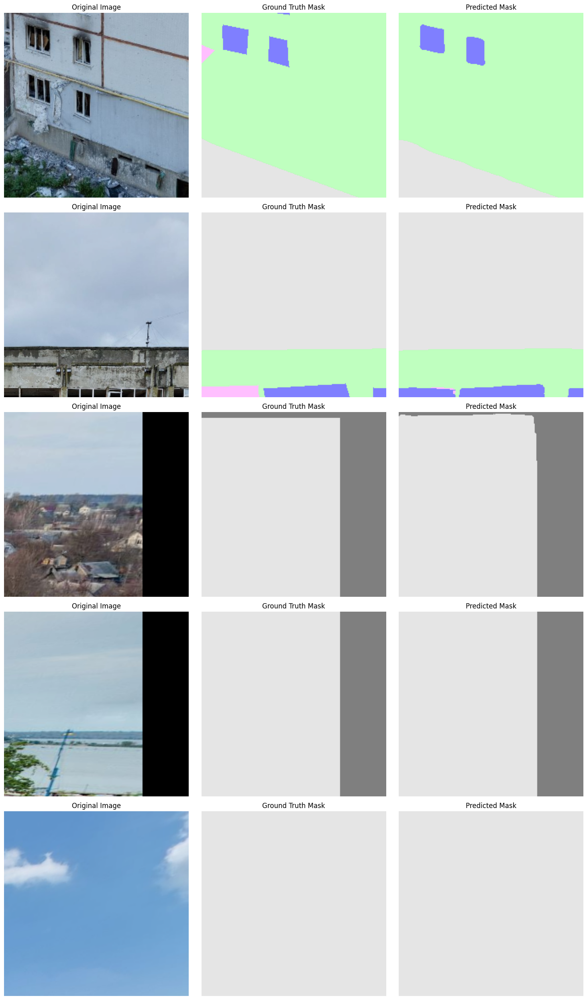


Epoch 2/10


Evaluating: 100%|██████████| 64/64 [00:32<00:00,  1.98it/s, Eval Loss=0.0273]


Train Loss: 0.0188, Pixel Accuracy: 0.9925
Valid Loss: 0.0331, Pixel Accuracy: 0.9891
Validation loss decreased (0.0352 --> 0.0331).  Saving model ...


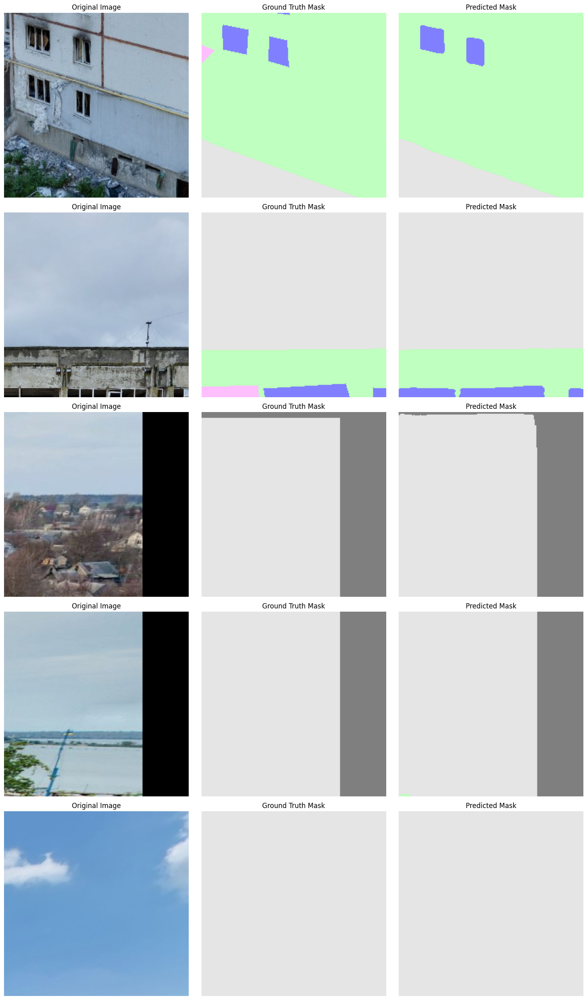


Epoch 3/10


Evaluating: 100%|██████████| 64/64 [00:32<00:00,  1.98it/s, Eval Loss=0.0252]

Train Loss: 0.0174, Pixel Accuracy: 0.9930
Valid Loss: 0.0332, Pixel Accuracy: 0.9895


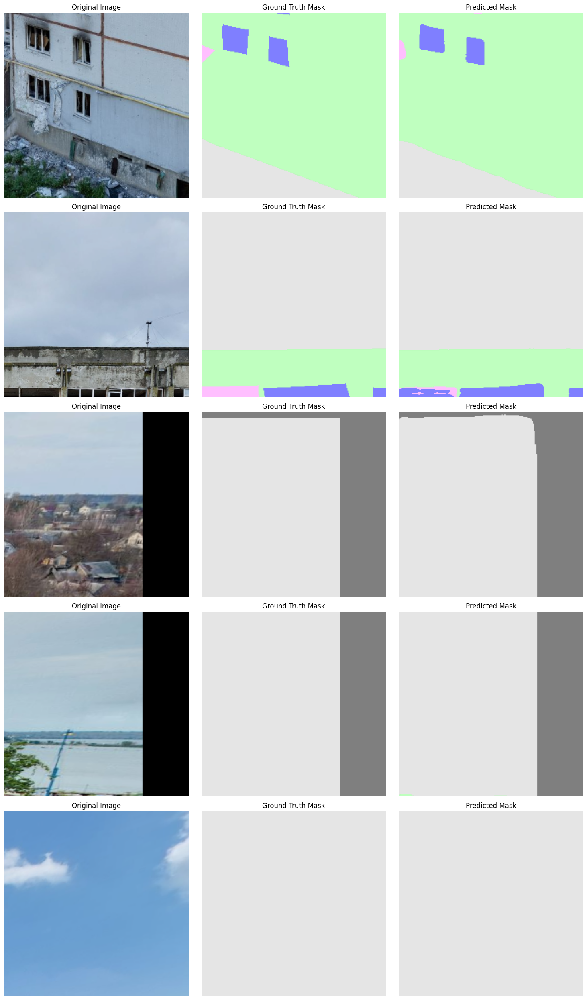


Epoch 4/10


Evaluating: 100%|██████████| 64/64 [00:32<00:00,  1.98it/s, Eval Loss=0.0247]


Train Loss: 0.0165, Pixel Accuracy: 0.9934
Valid Loss: 0.0329, Pixel Accuracy: 0.9897
Validation loss decreased (0.0331 --> 0.0329).  Saving model ...


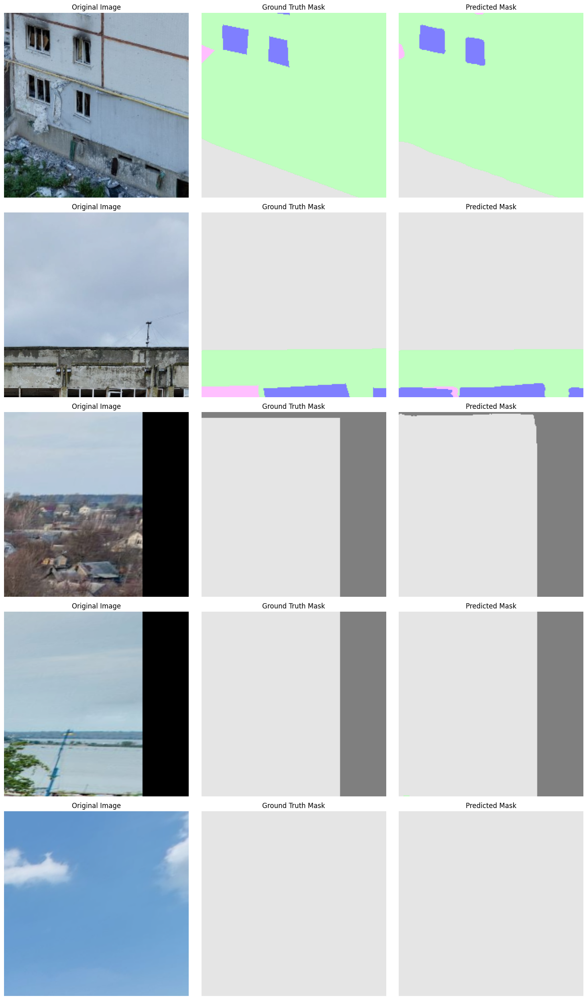


Epoch 5/10


Evaluating: 100%|██████████| 64/64 [00:32<00:00,  1.97it/s, Eval Loss=0.0235]


Train Loss: 0.0157, Pixel Accuracy: 0.9937
Valid Loss: 0.0316, Pixel Accuracy: 0.9902
Validation loss decreased (0.0329 --> 0.0316).  Saving model ...


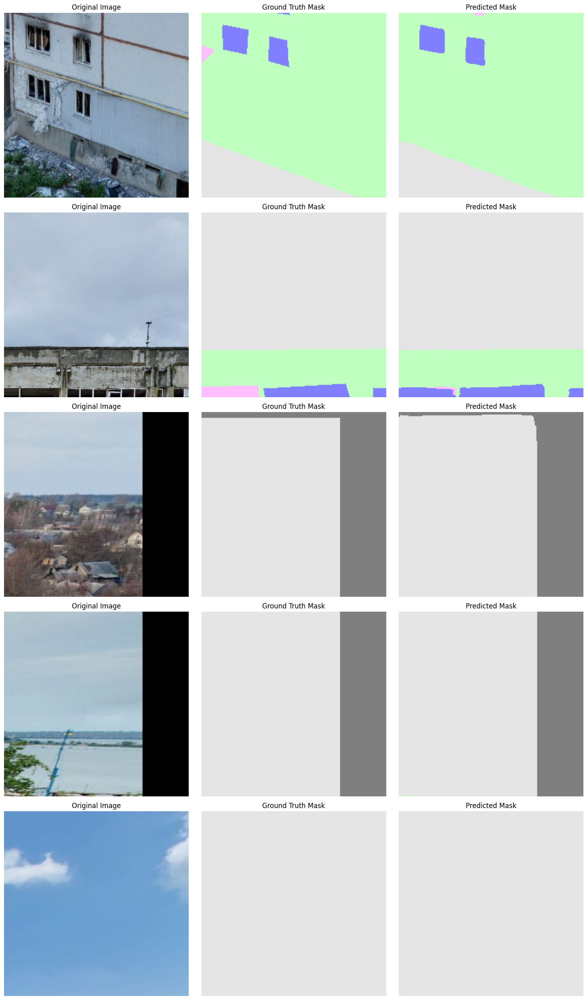


Epoch 6/10


Evaluating: 100%|██████████| 64/64 [00:32<00:00,  1.98it/s, Eval Loss=0.0319]

Train Loss: 0.0217, Pixel Accuracy: 0.9919
Valid Loss: 0.0458, Pixel Accuracy: 0.9858


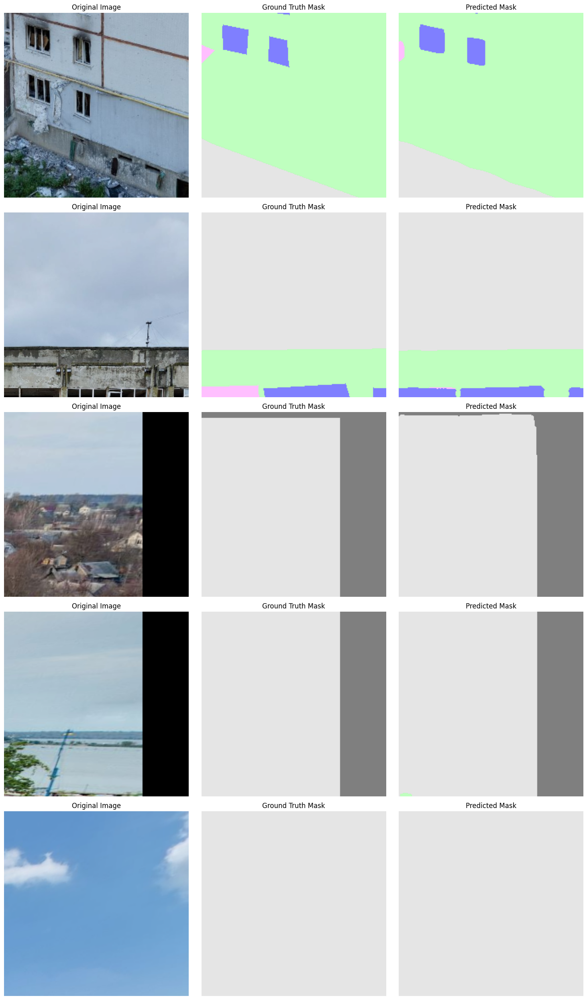


Epoch 7/10


Evaluating: 100%|██████████| 64/64 [00:32<00:00,  1.98it/s, Eval Loss=0.0243]

Train Loss: 0.0220, Pixel Accuracy: 0.9916
Valid Loss: 0.0343, Pixel Accuracy: 0.9893


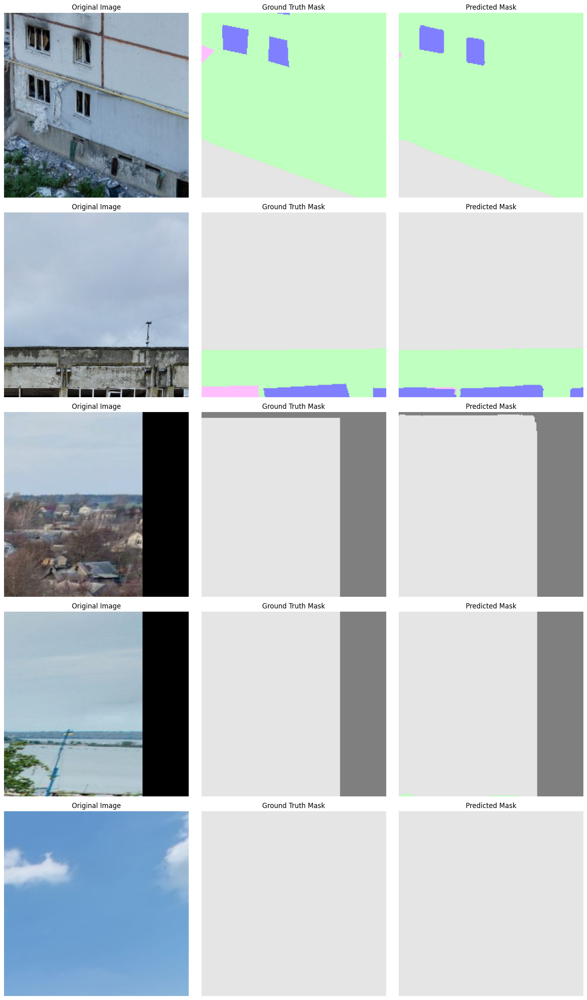


Epoch 8/10


Evaluating: 100%|██████████| 64/64 [00:32<00:00,  1.97it/s, Eval Loss=0.0217]

Train Loss: 0.0148, Pixel Accuracy: 0.9940
Valid Loss: 0.0320, Pixel Accuracy: 0.9903


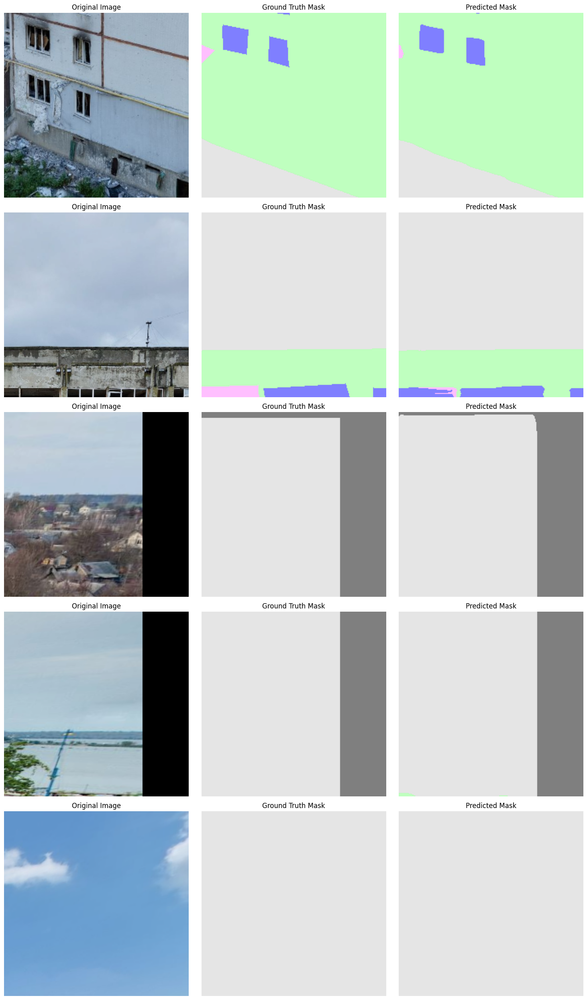


Epoch 9/10


Evaluating: 100%|██████████| 64/64 [00:32<00:00,  1.98it/s, Eval Loss=0.0215]


Train Loss: 0.0134, Pixel Accuracy: 0.9946
Valid Loss: 0.0304, Pixel Accuracy: 0.9909
Validation loss decreased (0.0316 --> 0.0304).  Saving model ...


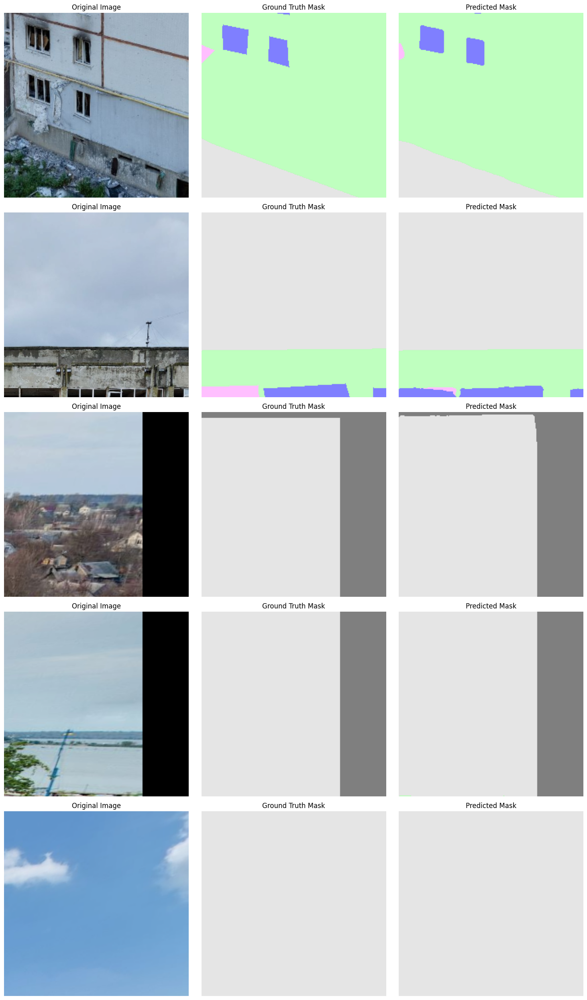


Epoch 10/10


Evaluating: 100%|██████████| 64/64 [00:31<00:00,  2.00it/s, Eval Loss=0.0213]


Train Loss: 0.0127, Pixel Accuracy: 0.9948
Valid Loss: 0.0292, Pixel Accuracy: 0.9912
Validation loss decreased (0.0304 --> 0.0292).  Saving model ...


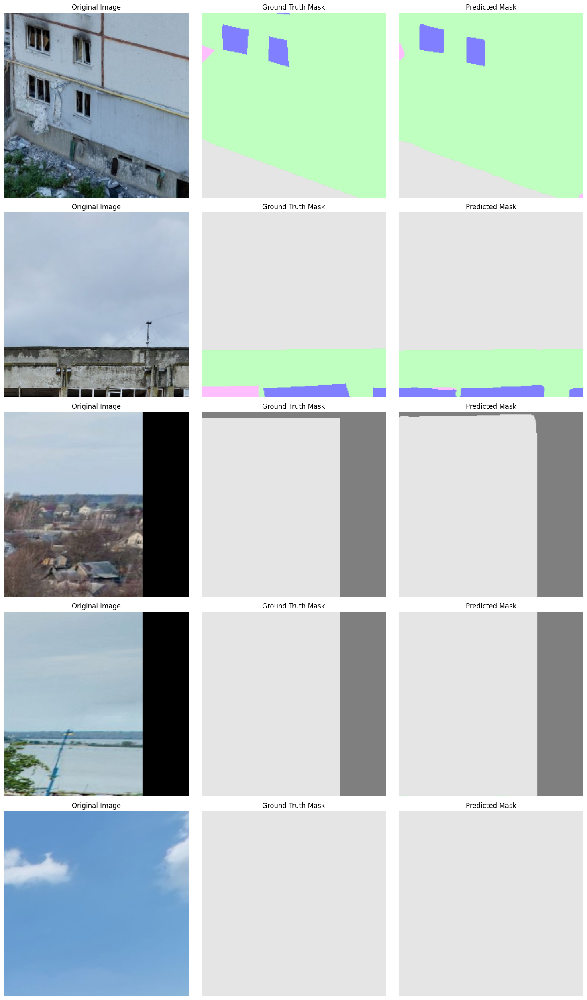

In [68]:
set_seed(Config.seed)

# Number of classes (including background if applicable)
num_classes = len(label_mapping) + 1  # Assuming background is class 0

# Initialize the model
model = UNetSwin(num_classes=num_classes).to(Config.device)
model.load_state_dict(torch.load('best_model.pth'))

# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(model.parameters(), lr=5e-5)

# Call the train function
metrics_history = train(
    model=model,
    optimizer=optimizer,
    criterion=criterion,
    train_loader=train_dataloader,
    valid_loader=val_dataloader,
    device=Config.device,
    num_epochs=Config.num_epochs,
    logdir=Config.logdir
)

# Plot metrics

In [69]:
def plot_metrics(metrics_history, num_classes, label_mapping, output_dir):
    """
    Plot training and validation metrics over epochs, including per-class IoU and Dice.

    Args:
        metrics_history (dict): Dictionary containing training and validation metrics.
                                Expected keys: 'train_loss', 'valid_loss',
                                               'train_pixel_accuracy', 'valid_pixel_accuracy',
                                               'train_iou', 'valid_iou',
                                               'train_dice', 'valid_dice'.
        num_classes (int): Number of classes in the dataset (excluding background if applicable).
        label_mapping (dict): Mapping of class names to their indices.
    """
    epochs = np.arange(1, len(metrics_history['train_loss']) + 1)
    class_names = label_mapping

    def set_y_axis_step(ax, step=0.1):
        """Helper function to set y-axis step."""
        ax.set_yticks(np.arange(0, 1.1, step))

    # Plot Loss
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, metrics_history['train_loss'], label='Train Loss')
    plt.plot(epochs, metrics_history['valid_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.grid()
    ax = plt.gca()
    set_y_axis_step(ax)
    plt.savefig(os.path.join(output_dir, "train_val_loss.png"))
    plt.show()

    # Plot Pixel Accuracy
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, metrics_history['train_pixel_accuracy'], label='Train Pixel Accuracy')
    plt.plot(epochs, metrics_history['valid_pixel_accuracy'], label='Validation Pixel Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Pixel Accuracy')
    plt.title('Training and Validation Pixel Accuracy')
    plt.legend()
    plt.grid()
    ax = plt.gca()
    set_y_axis_step(ax)
    plt.savefig(os.path.join(output_dir, "train_val_pixel_acc.png"))
    plt.show()

    # Plot IoU per class (Training)
    plt.figure(figsize=(12, 8))
    for class_idx, class_name in enumerate(class_names):
        class_iou = [epoch[class_idx] for epoch in metrics_history['train_iou']]
        plt.plot(epochs, class_iou, label=f'Train IoU: {class_name}')
    plt.xlabel('Epochs')
    plt.ylabel('IoU')
    plt.title('Training IoU per Class')
    plt.legend()
    plt.grid()
    ax = plt.gca()
    set_y_axis_step(ax)
    plt.savefig(os.path.join(output_dir, "train_iou_per_class.png"))
    plt.show()

    # Plot IoU per class (Validation)
    plt.figure(figsize=(12, 8))
    for class_idx, class_name in enumerate(class_names):
        class_iou = [epoch[class_idx] for epoch in metrics_history['valid_iou']]
        plt.plot(epochs, class_iou, label=f'Validation IoU: {class_name}')
    plt.xlabel('Epochs')
    plt.ylabel('IoU')
    plt.title('Validation IoU per Class')
    plt.legend()
    plt.grid()
    ax = plt.gca()
    set_y_axis_step(ax)
    plt.savefig(os.path.join(output_dir, "val_iou_per_class.png"))
    plt.show()

    # Plot Dice per class (Training)
    plt.figure(figsize=(12, 8))
    for class_idx, class_name in enumerate(class_names):
        class_dice = [epoch[class_idx] for epoch in metrics_history['train_dice']]
        plt.plot(epochs, class_dice, label=f'Train Dice: {class_name}')
    plt.xlabel('Epochs')
    plt.ylabel('Dice Coefficient')
    plt.title('Training Dice Coefficient per Class')
    plt.legend()
    plt.grid()
    ax = plt.gca()
    set_y_axis_step(ax)
    plt.savefig(os.path.join(output_dir, "train_dice_per_class.png"))
    plt.show()

    # Plot Dice per class (Validation)
    plt.figure(figsize=(12, 8))
    for class_idx, class_name in enumerate(class_names):
        class_dice = [epoch[class_idx] for epoch in metrics_history['valid_dice']]
        plt.plot(epochs, class_dice, label=f'Validation Dice: {class_name}')
    plt.xlabel('Epochs')
    plt.ylabel('Dice Coefficient')
    plt.title('Validation Dice Coefficient per Class')
    plt.legend()
    plt.grid()
    ax = plt.gca()
    set_y_axis_step(ax)
    plt.savefig(os.path.join(output_dir, "val_dice_per_class.png"))
    plt.show()

    # Plot Mean IoU
    plt.figure(figsize=(10, 6))
    train_iou = np.array(metrics_history['train_iou']).mean(axis=1)  # Average IoU across classes
    valid_iou = np.array(metrics_history['valid_iou']).mean(axis=1)
    plt.plot(epochs, train_iou, label='Train IoU (mean across classes)')
    plt.plot(epochs, valid_iou, label='Validation IoU (mean across classes)')
    plt.xlabel('Epochs')
    plt.ylabel('IoU')
    plt.title('Training and Validation Mean IoU')
    plt.legend()
    plt.grid()
    ax = plt.gca()
    set_y_axis_step(ax)
    plt.savefig(os.path.join(output_dir, "train_val_mean_iou.png"))
    plt.show()

    # Plot Mean Dice Coefficient
    plt.figure(figsize=(10, 6))
    train_dice = np.array(metrics_history['train_dice']).mean(axis=1)  # Average Dice across classes
    valid_dice = np.array(metrics_history['valid_dice']).mean(axis=1)
    plt.plot(epochs, train_dice, label='Train Dice Coefficient (mean across classes)')
    plt.plot(epochs, valid_dice, label='Validation Dice Coefficient (mean across classes)')
    plt.xlabel('Epochs')
    plt.ylabel('Dice Coefficient')
    plt.title('Training and Validation Mean Dice Coefficient')
    plt.legend()
    plt.grid()
    ax = plt.gca()
    set_y_axis_step(ax)
    plt.savefig(os.path.join(output_dir, "train_val_mean_dice.png"))
    plt.show()


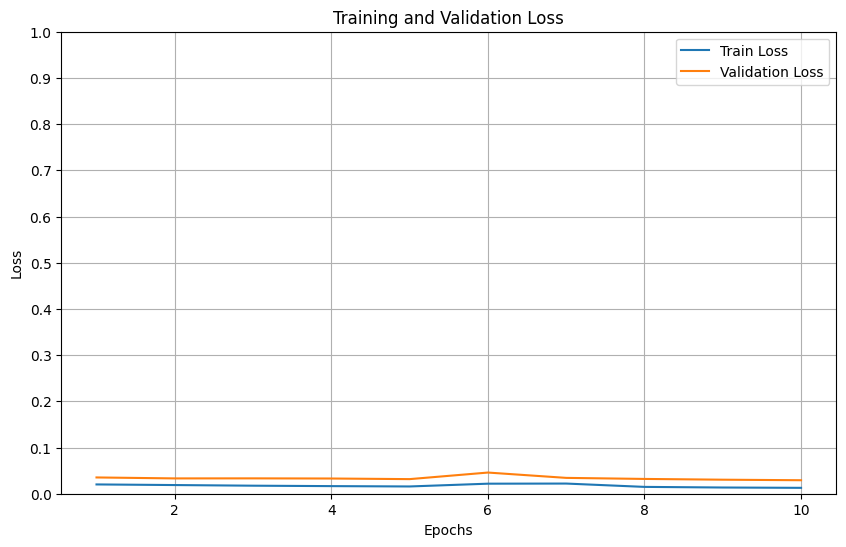

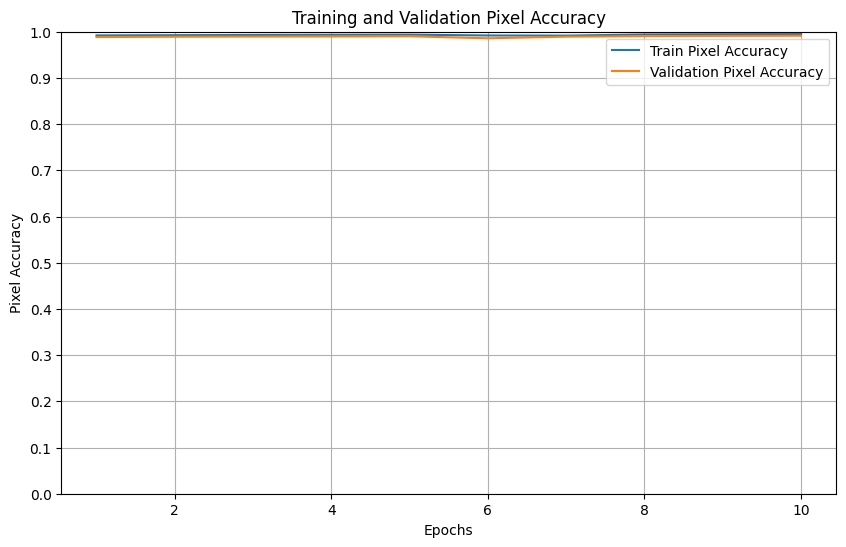

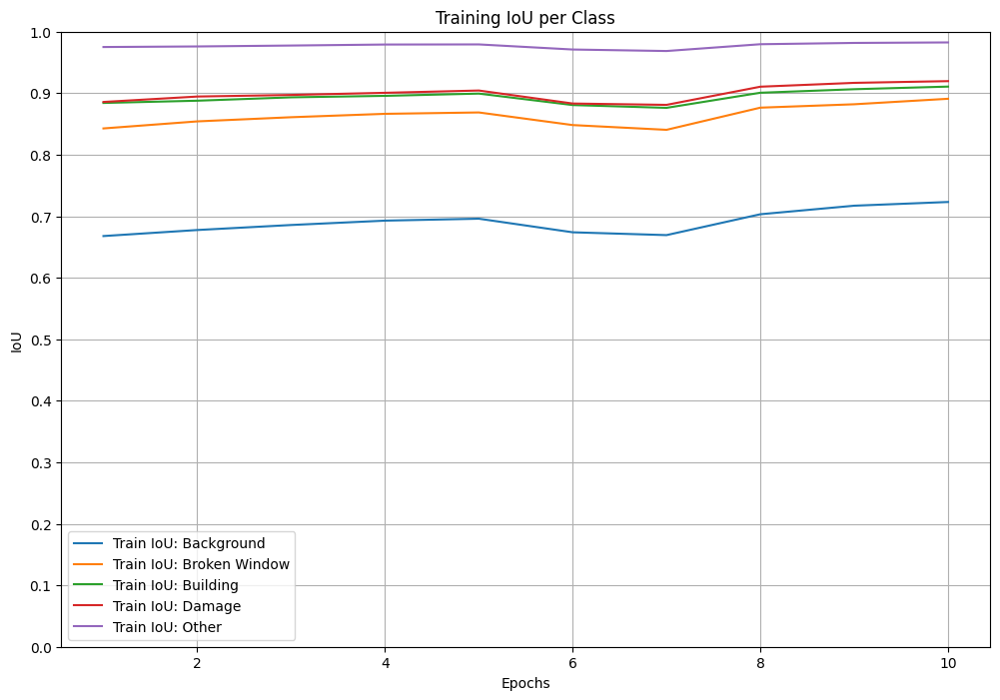

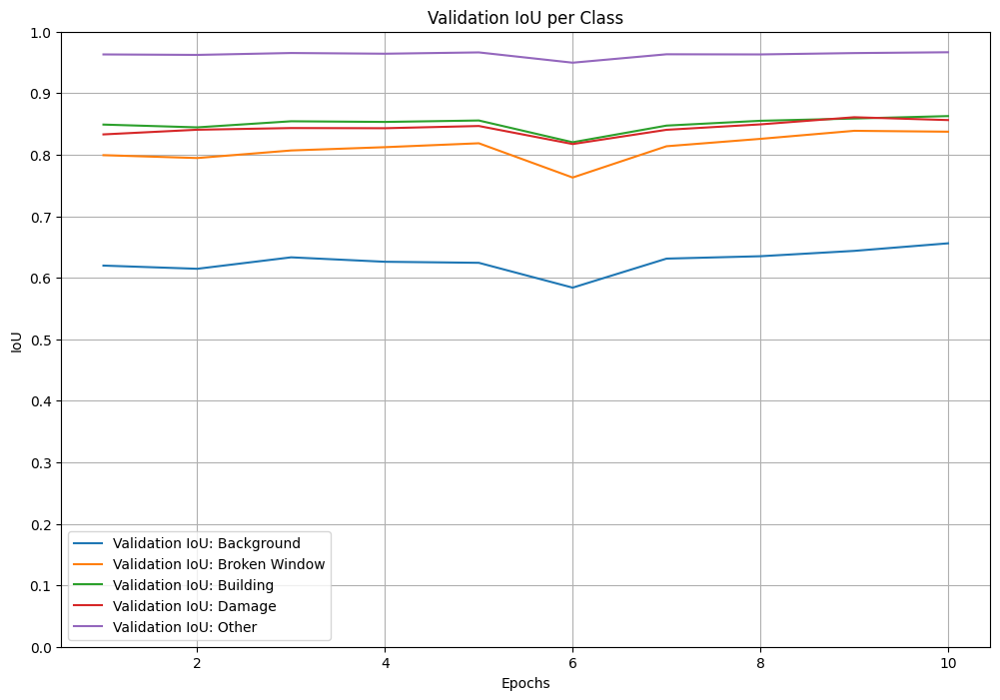

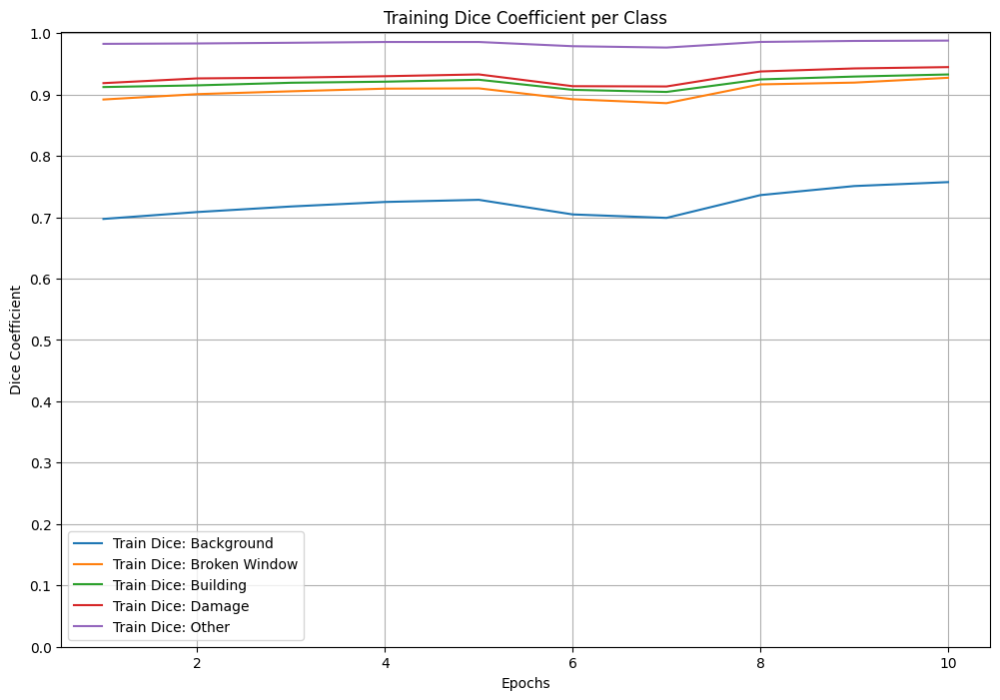

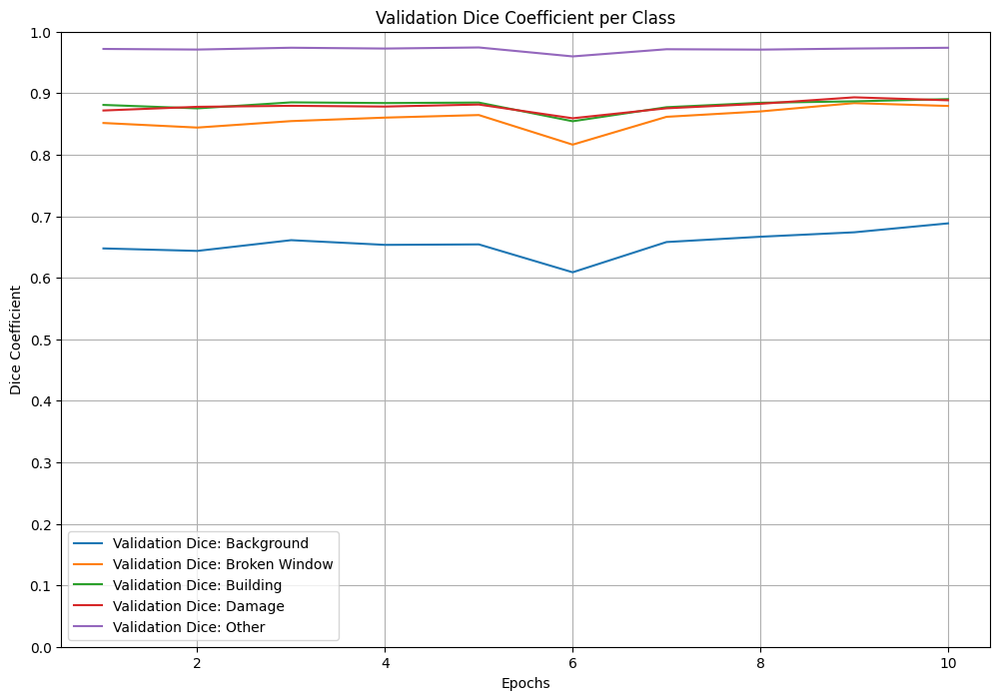

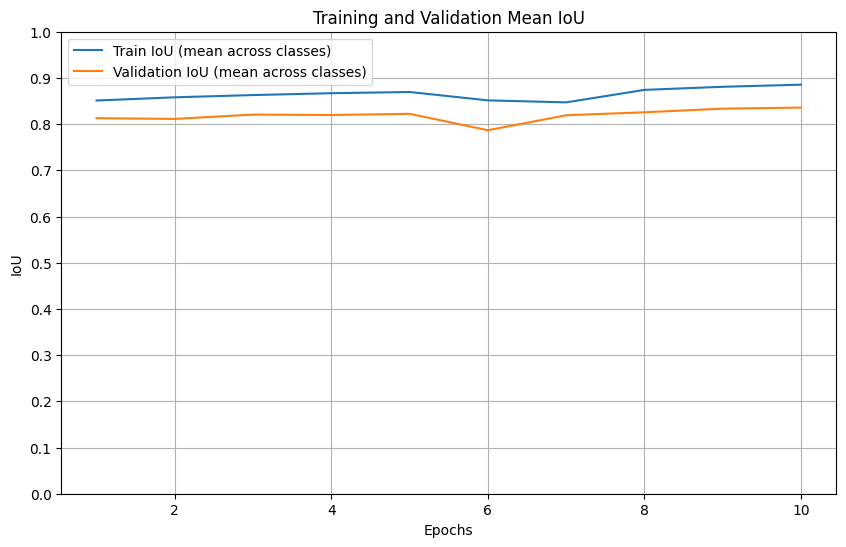

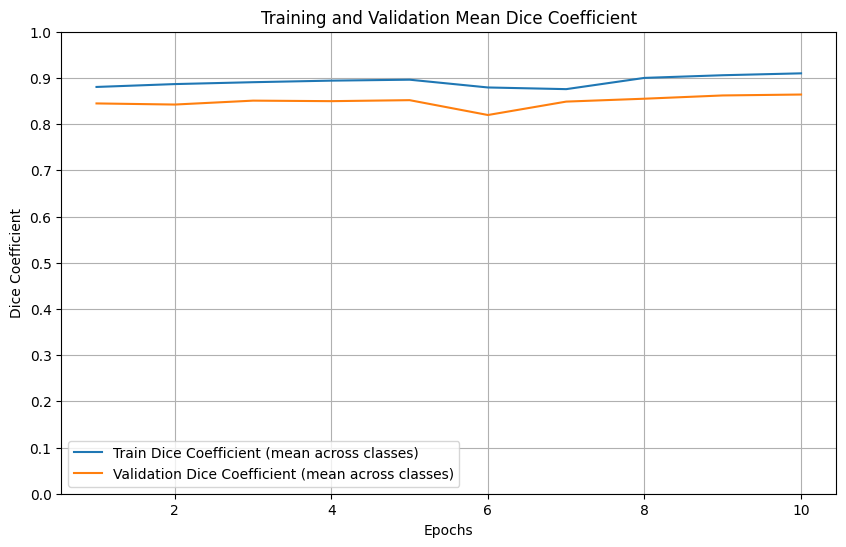

In [77]:
classes = [
    'Background',
    'Broken Window',
    'Building',
    'Damage',
    'Other',
    ]

plot_metrics(metrics_history, model.num_classes, classes, output_dir="Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e")

# Predict images

In [78]:
def predict_full_image(model, image, embedding_model, patch_size=(224, 224), stride=112, device=Config.device):
    # model.eval()
    width, height = image.size
    pad_w = (patch_size[0] - width % stride) % stride
    pad_h = (patch_size[1] - height % stride) % stride
    padded_width = width + pad_w
    padded_height = height + pad_h

    # Pad the image
    image_padded = Image.new('RGB', (padded_width, padded_height))
    image_padded.paste(image, (0, 0))

    # Initialize arrays to hold predictions and counts
    full_probs = np.zeros((padded_height, padded_width, num_classes), dtype=np.float32)
    count_predictions = np.zeros((padded_height, padded_width), dtype=np.float32)

    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])
    full_image_transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize to Swin Transformer input size
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    image_tensor = full_image_transform(image).unsqueeze(0).to(device)
    with torch.no_grad():
        full_image_embedding = embedding_model(image_tensor)
        full_image_embedding = full_image_embedding.squeeze(0).cpu().numpy()  # [1024]

    with torch.no_grad():
        for y in range(0, padded_height - patch_size[1] + 1, stride):
            for x in range(0, padded_width - patch_size[0] + 1, stride):
                image_patch = image_padded.crop((x, y, x + patch_size[0], y + patch_size[1]))
                image_tensor = transform(image_patch).unsqueeze(0).to(device)

                norm_x = x / padded_width
                norm_y = y / padded_height
                pos_embedding = torch.tensor([[norm_x, norm_y]], dtype=torch.float32).to(device)

                image_embedding = torch.tensor([full_image_embedding], dtype=torch.float32).to(device)

                output = model(image_tensor, image_embedding, pos_embedding)  # Output shape: [1, num_classes, H, W]
                probs = torch.softmax(output, dim=1)  # Convert logits to probabilities
                probs = probs.squeeze(0).cpu().numpy()  # Shape: [num_classes, H, W]

                # Accumulate probabilities
                full_probs[y:y + patch_size[1], x:x + patch_size[0], :] += probs.transpose(1, 2, 0)
                count_predictions[y:y + patch_size[1], x:x + patch_size[0]] += 1

    # Average the probabilities where patches overlap
    full_probs /= np.expand_dims(count_predictions, axis=2)
    full_probs = full_probs[:height, :width, :]  # Remove padding
    final_prediction = np.argmax(full_probs, axis=2).astype(np.uint8)  # Shape: [H, W]

    return final_prediction


In [79]:
def visualize_prediction_with_colors(image, prediction, color_mapping):
    """
    Visualize the predicted labels on the image using specified colors.

    Args:
        image (PIL.Image.Image): Original input image.
        prediction (np.ndarray): Predicted label mask of shape [H, W].
        color_mapping (dict): Dictionary mapping label IDs to RGBA colors.

    Returns:
        PIL.Image.Image: Visualization with the predicted labels overlaid on the image.
    """
    # Convert the image to RGBA mode to overlay semi-transparent colors
    image = image.convert("RGBA")
    overlay = Image.new("RGBA", image.size, (0, 0, 0, 0))
    draw = ImageDraw.Draw(overlay)

    # Overlay colors based on predictions
    height, width = prediction.shape
    for y in range(height):
        for x in range(width):
            label = prediction[y, x]
            if label in color_mapping:
                draw.point((x, y), fill=color_mapping[label])

    # Blend the original image with the overlay
    blended = Image.alpha_composite(image, overlay)
    return blended


In [70]:
def process_and_predict_images(model, image_files, embedding_model, output_dir, color_mapping,
                               patch_size=(224, 224), stride=112, device=Config.device):
    """
    Predict segmentation maps for a list of image files and save the results.

    Args:
        model (torch.nn.Module): Trained segmentation model.
        image_files (list of str): List of file paths to images for prediction.
        output_dir (str): Directory where the output images will be saved.
        color_mapping (dict): Mapping of label IDs to RGBA colors for visualization.
        patch_size (tuple): Size of the patches for the sliding window.
        stride (int): Stride for the sliding window.
        device (str): Device to run the model on ('cuda' or 'cpu').
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    model.eval()
    embedding_model.eval()

    for image_path in tqdm(image_files, desc="Processing images"):
        try:
            # Validate and load the image
            if not os.path.isfile(image_path):
                print(f"Skipping invalid file: {image_path}")
                continue

            image = Image.open(image_path).convert("RGB")
        except Exception as e:
            print(f"Error loading image {image_path}: {e}")
            continue

        # Predict the segmentation map
        prediction = predict_full_image(model, image, embedding_model, patch_size=patch_size, stride=stride, device=device)

        # Visualize the prediction
        visualization = visualize_prediction_with_colors(image, prediction, color_mapping)

        # Save the output image
        image_name, _ = os.path.splitext(os.path.basename(image_path))
        output_file = os.path.join(output_dir, f"{image_name}_pred.png")

        # Save the output image
        visualization.save(output_file, format="PNG")

        print(f"Saved visualization: {output_file}")


In [71]:
image_files = ['img1.jpg', 'img2.jpg', 'img3.jpeg', 'img4.jpg', 'img5.png', 'img6.jpeg', 'img7.jpg', 'img8.jpg']  # List of image files
output_dir = 'Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e'  # Directory to save results
color_mapping = {
    0: (0, 0, 0, 128),        # Black for 'Background', semi-transparent
    1: (0, 0, 255, 128),      # Blue for 'Broken Window', semi-transparent
    2: (0, 255, 0, 64),      # Green for 'Building', semi-transparent
    3: (255, 0, 255, 64),    # Purpule for 'Damage', semi-transparent
    4: (211, 211, 211, 150),  # Light grey for 'Other', semi-transparent
}

model.load_state_dict(torch.load('best_model.pth'))
model.to(Config.device)

embedding_model = create_model(
    'swin_base_patch4_window7_224',
    pretrained=True,
    num_classes=0
)
embedding_model.to(Config.device)

process_and_predict_images(model, image_files, embedding_model, output_dir, color_mapping,
                           patch_size=(224, 224), stride=112)

<ipython-input-71-845ad30fcd5b>:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))
Processing images:  12%|█▎        | 1/8

Saved visualization: Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/img1_pred.png


Processing images:  25%|██▌       | 2/8 [00:05<00:15,  2.55s/it]

Saved visualization: Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/img2_pred.png


Processing images:  38%|███▊      | 3/8 [00:11<00:21,  4.32s/it]

Saved visualization: Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/img3_pred.png


Processing images:  50%|█████     | 4/8 [00:12<00:11,  2.89s/it]

Saved visualization: Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/img4_pred.png


Processing images:  62%|██████▎   | 5/8 [00:17<00:10,  3.46s/it]

Saved visualization: Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/img5_pred.png


Processing images:  75%|███████▌  | 6/8 [00:22<00:07,  3.98s/it]

Saved visualization: Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/img6_pred.png


Processing images:  88%|████████▊ | 7/8 [00:23<00:03,  3.32s/it]

Saved visualization: Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/img7_pred.png


Processing images: 100%|██████████| 8/8 [00:25<00:00,  3.21s/it]

Saved visualization: Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/img8_pred.png


Broken Window: **Blue**, Building: **Green**, Damage: **Purple**, Damaged roof: **Red**, Other: **Grey**, Roof: **Orange**

# Calculating accuracy

In [72]:
def evaluate_test_set(model, test_loader, device='cuda'):
    """
    Evaluate segmentation model on the test set using patched images and masks.
    Computes pixel accuracy, IoU, and Dice metrics.

    Args:
        model (torch.nn.Module): Trained segmentation model.
        test_loader (DataLoader): DataLoader containing patched test data.
        device (str): Device to run the model on ('cuda' or 'cpu').

    Returns:
        dict: Dictionary containing average Pixel Accuracy, IoU, and Dice scores.
    """
    model.eval()  # Set the model to evaluation mode
    total_pixel_accuracy = 0
    iou_list = []
    dice_list = []
    num_images = 0

    with torch.no_grad():  # Disable gradient calculations for evaluation
        for imgs, masks, image_embeddings, position_embeddings in tqdm(test_loader, desc="Evaluating Test Set"):
            imgs = imgs.to(device)
            masks = masks.cpu().numpy()
            image_embeddings = image_embeddings.to(device)
            position_embeddings = position_embeddings.to(device)
            # Forward pass
            outputs = model(imgs, image_embeddings, position_embeddings)  # Shape: [batch_size, num_classes, H, W]
            preds = torch.argmax(outputs, dim=1).cpu().numpy()  # Get predicted masks (batch_size, H, W)

            # Calculate metrics for each image in the batch
            for pred, true_mask in zip(preds, masks):
                pixel_accuracy = calculate_pixel_accuracy(pred, true_mask)
                iou = calculate_iou(pred, true_mask, model.num_classes)
                dice = calculate_dice(pred, true_mask, model.num_classes)

                total_pixel_accuracy += pixel_accuracy
                iou_list.append(iou)
                dice_list.append(dice)
                num_images += 1

    # Average metrics
    avg_pixel_accuracy = total_pixel_accuracy / num_images
    avg_iou = np.nanmean(iou_list, axis=0)  # Ignore NaNs for classes with no ground truth
    avg_dice = np.nanmean(dice_list, axis=0)

    print("\nEvaluation Metrics:")
    print(f"Pixel Accuracy: {avg_pixel_accuracy:.4f}")
    print(f"IoU per class: {avg_iou}")
    print(f"Dice per class: {avg_dice}")

    return {
        "Pixel Accuracy": avg_pixel_accuracy,
        "IoU": avg_iou,
        "Dice": avg_dice
    }

In [73]:
model = UNetSwin(num_classes=num_classes).to(Config.device)
model.load_state_dict(torch.load('best_model.pth'))

metrics = evaluate_test_set(
    model=model,
    test_loader=test_dataloader,
    device=Config.device,
)

[192, 384, 768, 1536]
Encoder layer 0 frozen.
Encoder layer 1 frozen.
Encoder layer 2 unfrozen.
Encoder layer 3 unfrozen.
Encoder layer 4 unfrozen.


<ipython-input-73-8b876c15e724>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))
Evaluating Test Set: 100%|██████████| 64


Evaluation Metrics:
Pixel Accuracy: 0.9915
IoU per class: [0.69953455 0.83094062 0.86331671 0.85123344 0.96641839]
Dice per class: [0.72796841 0.87664923 0.8893088  0.88163811 0.97309615]


In [74]:
def save_metrics_to_file(metrics, classes, output_file):
    """
    Save segmentation metrics and per-class stats to a text file.

    Args:
        metrics (dict): Dictionary containing the metrics ('Pixel Accuracy', 'IoU', 'Dice').
        classes (list): List of class names.
        output_file (str): Path to the output text file.
    """
    with open(output_file, "w") as file:
        # Write Pixel Accuracy
        file.write(f"Pixel Accuracy: {metrics['Pixel Accuracy']:.4f}\n")

        # Write IoU and Dice per class
        for cls_idx, (iou, dice) in enumerate(zip(metrics["IoU"], metrics["Dice"])):
            file.write(f"Class {classes[cls_idx]}: IoU: {iou:.4f}, Dice: {dice:.4f}\n")

        # Write Mean IoU and Dice
        file.write(f"Mean IoU: {np.mean(metrics['IoU']):.4f}\n")
        file.write(f"Mean Dice: {np.mean(metrics['Dice']):.4f}\n")

    print(f"Metrics saved to {output_file}")


In [75]:
classes = [
    'Background',
    'Broken Window',
    'Building',
    'Damage',
    'Other',
    ]

output_file = "./Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/test_metrics.txt"
save_metrics_to_file(metrics, classes, output_file)

print(f"Pixel Accuracy: {metrics['Pixel Accuracy']:.4f}")
for cls_idx, (iou, dice) in enumerate(zip(metrics["IoU"], metrics["Dice"])):
    print(f"Class {classes[cls_idx]}: IoU: {iou:.4f}, Dice: {dice:.4f}")

print(f"Mean IoU: {np.mean(metrics['IoU']):.4f}")
print(f"Mean Dice: {np.mean(metrics['Dice']):.4f}")

Metrics saved to ./Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/test_metrics.txt
Pixel Accuracy: 0.9915
Class Background: IoU: 0.6995, Dice: 0.7280
Class Broken Window: IoU: 0.8309, Dice: 0.8766
Class Building: IoU: 0.8633, Dice: 0.8893
Class Damage: IoU: 0.8512, Dice: 0.8816
Class Other: IoU: 0.9664, Dice: 0.9731
Mean IoU: 0.8423
Mean Dice: 0.8697


In [80]:
!zip -r "Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e.zip" "Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e"

  adding: Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/ (stored 0%)
  adding: Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/train_val_pixel_acc.png (deflated 23%)
  adding: Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/train_val_loss.png (deflated 24%)
  adding: Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/train_iou_per_class.png (deflated 18%)
  adding: Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/val_iou_per_class.png (deflated 18%)
  adding: Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/img6_pred.png (deflated 0%)
  adding: Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/img8_pred.png (deflated 0%)
  adding: Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/img7_pred.png (deflated 0%)
  adding: Swin_large_img_pos_emb_partially_unfreezed(2,3,4)_224_112_20+10e/val_dice_per_class.png (deflated 18%)
  adding: Swin_large_img_pos_emb_partiall